# Multi-robot Learning Over Subgoals Planning
**Multi-robot Learning over Subgoals Planning (MR-LSP)** is a planning framework that allows multiple robots to coordinate and reach a point-goal in partially-mapped environment in minimum expected distance leveraging learning. For more info, refer to the paper: [Paper](https://arxiv.org/abs/2303.16654)

In this notebook, we see how we use MR-LSP to make multiple robots reach a point goal.

In [1]:
import environments
import matplotlib.pyplot as plt
import lsp
import mrlsp
import mr_exploration

### Setting the arguments
Setting up arguments for the simulator, robot and environment

In [2]:
# Set the arguments (usually done via the command line)
args = lambda: None
args.current_seed = 2129
args.map_type = 'office2'
args.unity_path = '/unity/rail_sim.x86_64'
args.save_dir = './'
args.num_robots = 2 # the number of robots


# Robot Arguments
args.step_size = 1.8
args.num_primitives = 32
args.laser_scanner_num_points = 1024
args.field_of_view_deg = 360
args.laser_max_range_m = 18

args.inflation_radius_m = 0.75
args.base_resolution = 0.5
args.comm_range = float('inf')
args.network_file = '/data/lsp/office/training_logs/dbg/VisLSPOriented.pt'  # This is the learned model for 'office2' environment
args.disable_known_grid_correction = True

### A simulated environment
We run MR-LSP on a simulated environment. The argument `args.map_type = office2` in previous cell lets us set which environment we're running simulation in. You can choose between [`maze`, `office`, and `office2`]. In this notebook, we aim to run simulation in office2 environment.

Try changing `args.map_type` to see different maps.

NOTE: The `args.network_file` stores the path to a learned model file for `office2` environment. Therefore, in this notebook we're using `office2` environment to visualize MR-LSP planner. You could use the same learned model in `'office'` or `'maze'` environment but the performance would not be good because the newtork is trained in `'office2'` environment. However, you can simulate a non-learned *optimistic* planner in those environment to see its performance (see below on how to do that).

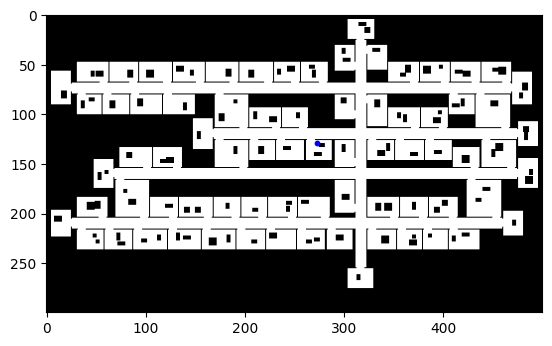

In [3]:
known_map, map_data, pose, goal = environments.generate.map_and_poses(args)

#print(known_map)
# Plotting
fig = plt.figure()
mr_exploration.utils.plotting.plot_grid_with_frontiers(ax=plt.gca(),
                                              grid_map=known_map,
                                              known_map=known_map,
                                              frontiers=[])

mr_exploration.utils.plotting.plot_pose(plt.gca(), pose, color='blue')
#mr_exploration.utils.plotting.plot_pose(plt.gca(), goal, color='green')

In the cell above, `environments.generate.map_and_poses(args)` gives the map, metadata associated with that map, the start pose, and the goal pose in the environment. We want our multiple robots to start from the start location and reach the goal location.

### Initializing robots and MR-LSP Planner
Our multiple robot team starts from the start location (`pose`) that we got from previous cell. We call `get_robot_team` function to get a list of robots that have `pose` as starting position.

#### Planner
We initialize MR-LSP planner by `mrlsp.planners.MRLearnedSubgoalPlanner(robot_team, goal_poses, args)'`. If you want to simulate a non-learned *optimistic* planner, change the line to
```python
planner = mrlsp.planners.MROptimisticPlanner(robot_team, goal_poses, args)
```

In [4]:
start_poses = [pose for _ in range(args.num_robots)]
#goal_poses = [goal for _ in range(args.num_robots)]

# Get robot team
robot_team = mr_exploration.utils.utility.get_robot_team(num_robots=args.num_robots,
                                                start_poses=start_poses,
                                                primitive_length=args.step_size,
                                                num_primitives=args.num_primitives,
                                                map_data=map_data)

# Initialize planner
# planner = mrlsp.planners.MRLearnedSubgoalPlanner(robot_team, goal_poses, args)
planner = mr_exploration.planners.MRAreaExplorePlanner(robot_team, args)

### The visual simulator and the planning loop
Learn more about the visual simulator here: ([link](https://github.com/RAIL-group/RAIL-group-software/blob/main/resources/notebooks/RAIL-onboarding-02-visual-simulator.ipynb)). Basically, the lines below are responsible for taking the known_map occupancy grid and setting up a simulated environment using unity game engine. `Simulator` is responsible for simulating laser scan from the robot's position, getting image from robot's panoramic camera and so on.

```python
# Instantiate the simulated environment
world = environments.simulated.OccupancyGridWorld(
        known_map,
        map_data,
        num_breadcrumb_elements=args.num_breadcrumb_elements,
        min_breadcrumb_signed_distance=4.0 * args.base_resolution)

builder = environments.simulated.WorldBuildingUnityBridge
with builder(args.unity_path) as unity_bridge:
    unity_bridge.make_world(world)
    simulator = lsp.simulators.Simulator(known_map,
                                         goal,
                                         args,
                                         unity_bridge=unity_bridge,
                                         world=world,
                                         verbose=False)
    # set the inflation radius
    simulator.frontier_grouping_inflation_radius = simulator.inflation_radius
```

#### Planning Loop
The planning loop (`mrlsp.planners.MRPlanningLoop`) is responsible to make get observations from the robot and making the robot move towards the subgoal. It works in the following way:
1) Till any robot reaches the goal:
   ```python
       for counter, step_data in enumerate(planning_loop):  # 1) while loop (till any robot reaches the goal)
           # 2) take observations and give observation to the planner
           # 3) planner computes the joint-action for multi-robot team and tells planning_loop to move robots
   ```
2) The planning loop takes observation from robots sensor (lidar and panoramic camera) and gives it to the planner (MR-LSP planner
   ```python
   planner.update({'images': step_data['images']},
                    step_data['robot_grids'],
                    step_data['subgoals'],
                    step_data['robot_poses'],
                    step_data['visibility_masks'],)
   ```
3) The planner computes the joint action for the robot team and updates the planning loop. The planning loop makes the robot move towards the action (subgoals) 
   ```python
       joint_action = planner.compute_selected_subgoal()
       planning_loop.set_chosen_subgoals(joint_action, counter)
   ```

Robot 0 | Subgoal (268, 143) | Dist: 16.90 | Area: 205 | Cost: -1008.10
Robot 0 | Subgoal (276, 136) | Dist: 9.41 | Area: 205 | Cost: -1015.59
Robot 0 | Subgoal (255, 111) | Dist: 27.80 | Area: 87631 | Cost: -438127.20
Robot 0 | Subgoal (247, 121) | Dist: 29.31 | Area: 62164 | Cost: -310790.69
Robot 1 | Subgoal (268, 143) | Dist: 16.90 | Area: 205 | Cost: -1008.10
Robot 1 | Subgoal (276, 136) | Dist: 9.41 | Area: 205 | Cost: -1015.59
Robot 1 | Subgoal (255, 111) | Dist: 27.80 | Area: 87631 | Cost: -438127.20
Robot 1 | Subgoal (247, 121) | Dist: 29.31 | Area: 62164 | Cost: -310790.69
----------------------------------------
Counter: 0
Robot0: (273.00, 129.00)
Total motion: 0.00
Robot1: (273.00, 129.00)
Total motion: 0.00


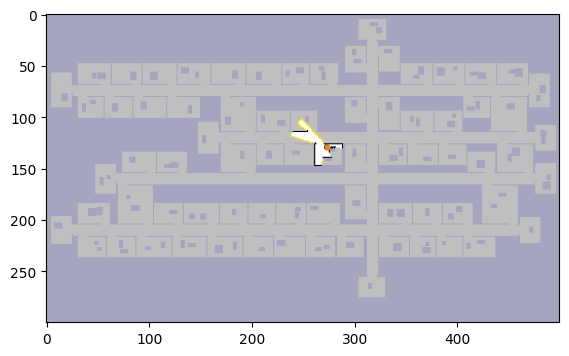

Robot 0 | Subgoal (268, 143) | Dist: 16.90 | Area: 197 | Cost: -968.10
Robot 0 | Subgoal (276, 136) | Dist: 9.41 | Area: 197 | Cost: -975.59
Robot 0 | Subgoal (284, 130) | Dist: 12.24 | Area: 197 | Cost: -972.76
Robot 0 | Subgoal (255, 111) | Dist: 27.80 | Area: 87639 | Cost: -438167.20
Robot 0 | Subgoal (247, 121) | Dist: 29.31 | Area: 62164 | Cost: -310790.69
Robot 1 | Subgoal (268, 143) | Dist: 16.90 | Area: 197 | Cost: -968.10
Robot 1 | Subgoal (276, 136) | Dist: 9.41 | Area: 197 | Cost: -975.59
Robot 1 | Subgoal (284, 130) | Dist: 12.24 | Area: 197 | Cost: -972.76
Robot 1 | Subgoal (255, 111) | Dist: 27.80 | Area: 87639 | Cost: -438167.20
Robot 1 | Subgoal (247, 121) | Dist: 29.31 | Area: 62164 | Cost: -310790.69
Robot 0 | Subgoal (259, 108) | Dist: 28.97 | Area: 378 | Cost: -1861.03
Robot 0 | Subgoal (268, 143) | Dist: 15.90 | Area: 188 | Cost: -924.10
Robot 0 | Subgoal (267, 119) | Dist: 13.24 | Area: 61701 | Cost: -308491.76
Robot 0 | Subgoal (284, 130) | Dist: 13.24 | Area: 18

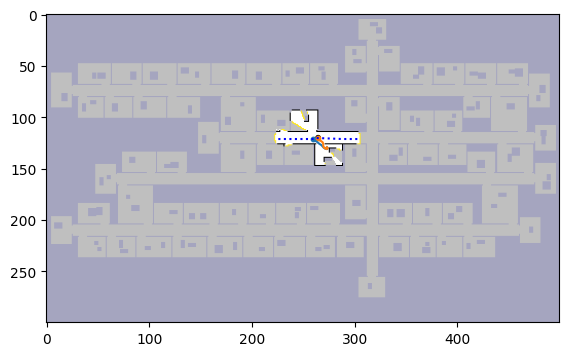

Robot 0 | Subgoal (244, 109) | Dist: 21.66 | Area: 57 | Cost: -263.34
Robot 0 | Subgoal (282, 138) | Dist: 33.46 | Area: 79 | Cost: -361.54
Robot 0 | Subgoal (304, 121) | Dist: 48.41 | Area: 88843 | Cost: -444166.59
Robot 0 | Subgoal (284, 131) | Dist: 32.56 | Area: 79 | Cost: -362.44
Robot 0 | Subgoal (230, 112) | Dist: 29.90 | Area: 537 | Cost: -2655.10
Robot 0 | Subgoal (279, 143) | Dist: 35.04 | Area: 40 | Cost: -164.96
Robot 0 | Subgoal (254, 95) | Dist: 26.83 | Area: 31 | Cost: -128.17
Robot 0 | Subgoal (249, 98) | Dist: 25.73 | Area: 88843 | Cost: -444189.27
Robot 0 | Subgoal (235, 127) | Dist: 24.90 | Area: 88843 | Cost: -444190.10
Robot 0 | Subgoal (271, 145) | Dist: 33.14 | Area: 40 | Cost: -166.86
Robot 0 | Subgoal (221, 120) | Dist: 36.00 | Area: 59912 | Cost: -299524.00
Robot 1 | Subgoal (244, 109) | Dist: 26.14 | Area: 57 | Cost: -258.86
Robot 1 | Subgoal (282, 138) | Dist: 29.56 | Area: 79 | Cost: -365.44
Robot 1 | Subgoal (304, 121) | Dist: 39.83 | Area: 88843 | Cost: -

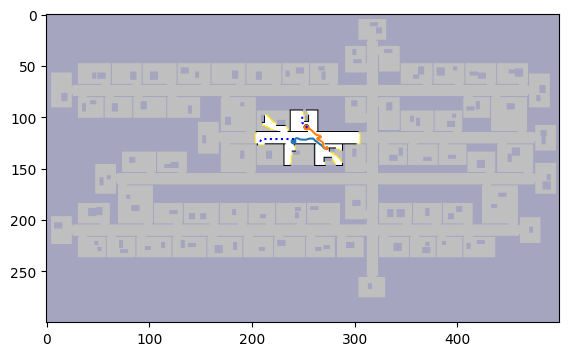

Robot 0 | Subgoal (304, 121) | Dist: 67.41 | Area: 89529 | Cost: -447577.59
Robot 0 | Subgoal (251, 97) | Dist: 41.63 | Area: 23 | Cost: -73.37
Robot 0 | Subgoal (284, 131) | Dist: 50.73 | Area: 76 | Cost: -329.27
Robot 0 | Subgoal (201, 120) | Dist: 37.83 | Area: 59219 | Cost: -296057.17
Robot 0 | Subgoal (234, 109) | Dist: 14.90 | Area: 89529 | Cost: -447630.10
Robot 0 | Subgoal (239, 141) | Dist: 20.24 | Area: 337 | Cost: -1664.76
Robot 0 | Subgoal (218, 101) | Dist: 30.63 | Area: 346 | Cost: -1699.37
Robot 0 | Subgoal (282, 138) | Dist: 50.63 | Area: 76 | Cost: -329.37
Robot 0 | Subgoal (279, 143) | Dist: 52.63 | Area: 40 | Cost: -147.37
Robot 0 | Subgoal (215, 109) | Dist: 27.97 | Area: 346 | Cost: -1702.03
Robot 0 | Subgoal (271, 145) | Dist: 51.31 | Area: 40 | Cost: -148.69
Robot 0 | Subgoal (243, 129) | Dist: 11.83 | Area: 337 | Cost: -1673.17
Robot 0 | Subgoal (209, 127) | Dist: 31.07 | Area: 430 | Cost: -2118.93
Robot 1 | Subgoal (304, 121) | Dist: 57.38 | Area: 89529 | Cost:

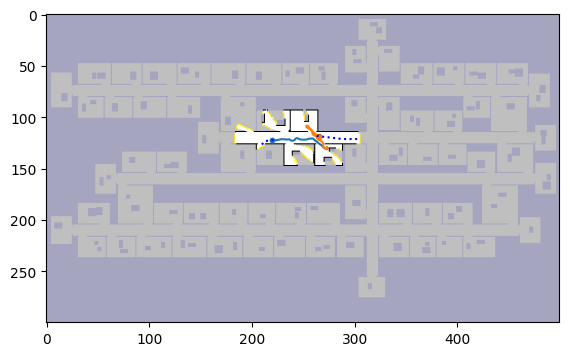

Robot 0 | Subgoal (219, 100) | Dist: 34.38 | Area: 132 | Cost: -625.62
Robot 0 | Subgoal (284, 131) | Dist: 70.73 | Area: 76 | Cost: -309.27
Robot 0 | Subgoal (181, 120) | Dist: 37.83 | Area: 58905 | Cost: -294487.17
Robot 0 | Subgoal (242, 141) | Dist: 38.14 | Area: 153 | Cost: -726.86
Robot 0 | Subgoal (282, 138) | Dist: 70.63 | Area: 76 | Cost: -309.37
Robot 0 | Subgoal (279, 143) | Dist: 72.63 | Area: 40 | Cost: -127.37
Robot 0 | Subgoal (251, 97) | Dist: 61.63 | Area: 22 | Cost: -48.37
Robot 0 | Subgoal (230, 97) | Dist: 35.21 | Area: 132 | Cost: -624.79
Robot 0 | Subgoal (271, 145) | Dist: 71.31 | Area: 40 | Cost: -128.69
Robot 0 | Subgoal (304, 121) | Dist: 87.41 | Area: 90111 | Cost: -450467.59
Robot 0 | Subgoal (254, 129) | Dist: 38.90 | Area: 28 | Cost: -101.10
Robot 0 | Subgoal (252, 138) | Dist: 43.21 | Area: 153 | Cost: -721.79
Robot 0 | Subgoal (209, 130) | Dist: 14.07 | Area: 404 | Cost: -2005.93
Robot 0 | Subgoal (210, 95) | Dist: 45.28 | Area: 129 | Cost: -599.72
Robot

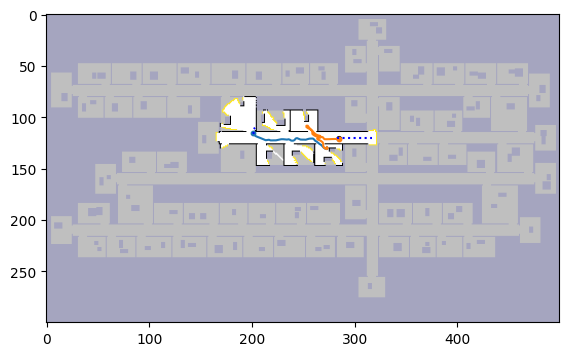

Robot 0 | Subgoal (177, 88) | Dist: 36.94 | Area: 91578 | Cost: -457853.06
Robot 0 | Subgoal (219, 100) | Dist: 50.73 | Area: 132 | Cost: -609.27
Robot 0 | Subgoal (284, 131) | Dist: 92.04 | Area: 76 | Cost: -287.96
Robot 0 | Subgoal (242, 141) | Dist: 59.46 | Area: 153 | Cost: -705.54
Robot 0 | Subgoal (215, 143) | Dist: 36.80 | Area: 218 | Cost: -1053.20
Robot 0 | Subgoal (282, 138) | Dist: 91.94 | Area: 76 | Cost: -288.06
Robot 0 | Subgoal (279, 143) | Dist: 93.94 | Area: 40 | Cost: -106.06
Robot 0 | Subgoal (251, 97) | Dist: 77.97 | Area: 22 | Cost: -32.03
Robot 0 | Subgoal (230, 97) | Dist: 51.56 | Area: 132 | Cost: -608.44
Robot 0 | Subgoal (173, 128) | Dist: 33.38 | Area: 91578 | Cost: -457856.62
Robot 0 | Subgoal (171, 106) | Dist: 33.49 | Area: 57062 | Cost: -285276.51
Robot 0 | Subgoal (271, 145) | Dist: 92.63 | Area: 40 | Cost: -107.37
Robot 0 | Subgoal (254, 129) | Dist: 60.21 | Area: 28 | Cost: -79.79
Robot 0 | Subgoal (163, 118) | Dist: 38.07 | Area: 552 | Cost: -2721.93


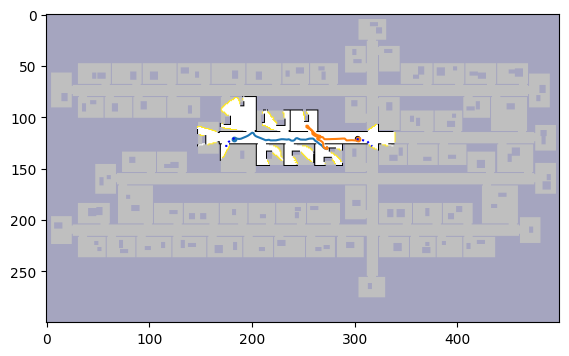

Robot 0 | Subgoal (219, 100) | Dist: 71.97 | Area: 132 | Cost: -588.03
Robot 0 | Subgoal (157, 110) | Dist: 27.56 | Area: 131 | Cost: -627.44
Robot 0 | Subgoal (284, 131) | Dist: 109.14 | Area: 76 | Cost: -270.86
Robot 0 | Subgoal (150, 117) | Dist: 31.90 | Area: 228 | Cost: -1108.10
Robot 0 | Subgoal (242, 141) | Dist: 76.56 | Area: 153 | Cost: -688.44
Robot 0 | Subgoal (215, 143) | Dist: 51.56 | Area: 113 | Cost: -513.44
Robot 0 | Subgoal (282, 138) | Dist: 109.04 | Area: 76 | Cost: -270.96
Robot 0 | Subgoal (279, 143) | Dist: 111.04 | Area: 40 | Cost: -88.96
Robot 0 | Subgoal (251, 97) | Dist: 99.21 | Area: 22 | Cost: -10.79
Robot 0 | Subgoal (317, 109) | Dist: 143.73 | Area: 56223 | Cost: -280971.27
Robot 0 | Subgoal (230, 97) | Dist: 72.80 | Area: 132 | Cost: -587.20
Robot 0 | Subgoal (171, 106) | Dist: 49.56 | Area: 56223 | Cost: -281065.44
Robot 0 | Subgoal (271, 145) | Dist: 109.73 | Area: 40 | Cost: -90.27
Robot 0 | Subgoal (174, 138) | Dist: 19.07 | Area: 92232 | Cost: -46114

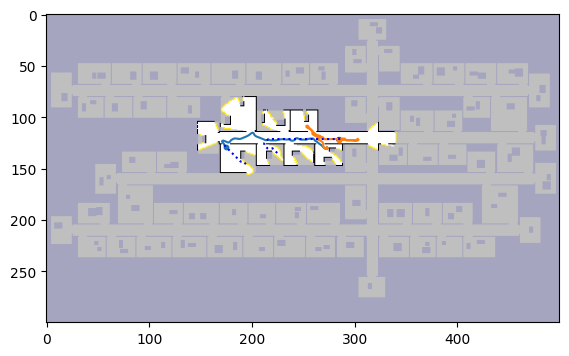

Robot 0 | Subgoal (219, 100) | Dist: 82.46 | Area: 132 | Cost: -577.54
Robot 0 | Subgoal (284, 131) | Dist: 117.14 | Area: 76 | Cost: -262.86
Robot 0 | Subgoal (150, 117) | Dist: 31.80 | Area: 37 | Cost: -153.20
Robot 0 | Subgoal (242, 141) | Dist: 84.56 | Area: 153 | Cost: -680.44
Robot 0 | Subgoal (215, 143) | Dist: 59.56 | Area: 113 | Cost: -505.44
Robot 0 | Subgoal (282, 138) | Dist: 117.04 | Area: 76 | Cost: -262.96
Robot 0 | Subgoal (279, 143) | Dist: 119.04 | Area: 40 | Cost: -80.96
Robot 0 | Subgoal (197, 150) | Dist: 31.87 | Area: 93017 | Cost: -465053.13
Robot 0 | Subgoal (251, 97) | Dist: 109.70 | Area: 22 | Cost: -0.30
Robot 0 | Subgoal (230, 97) | Dist: 83.28 | Area: 132 | Cost: -576.72
Robot 0 | Subgoal (171, 106) | Dist: 60.04 | Area: 55451 | Cost: -277194.96
Robot 0 | Subgoal (271, 145) | Dist: 117.73 | Area: 40 | Cost: -82.27
Robot 0 | Subgoal (316, 108) | Dist: 154.21 | Area: 55451 | Cost: -277100.79
Robot 0 | Subgoal (151, 125) | Dist: 31.38 | Area: 37 | Cost: -153.6

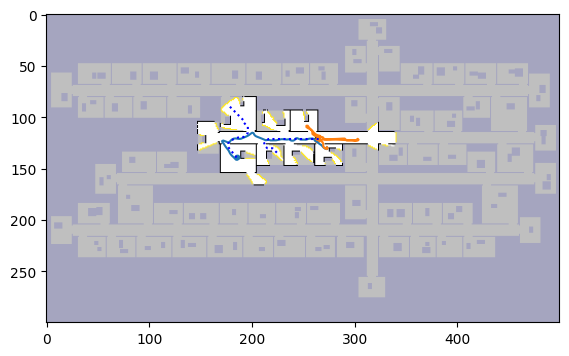

Robot 0 | Subgoal (219, 100) | Dist: 90.53 | Area: 132 | Cost: -569.47
Robot 0 | Subgoal (284, 131) | Dist: 125.21 | Area: 76 | Cost: -254.79
Robot 0 | Subgoal (198, 137) | Dist: 19.31 | Area: 54 | Cost: -250.69
Robot 0 | Subgoal (150, 117) | Dist: 42.11 | Area: 37 | Cost: -142.89
Robot 0 | Subgoal (242, 141) | Dist: 92.63 | Area: 153 | Cost: -672.37
Robot 0 | Subgoal (215, 143) | Dist: 67.63 | Area: 113 | Cost: -497.37
Robot 0 | Subgoal (282, 138) | Dist: 125.11 | Area: 76 | Cost: -254.89
Robot 0 | Subgoal (279, 143) | Dist: 127.11 | Area: 40 | Cost: -72.89
Robot 0 | Subgoal (251, 97) | Dist: 117.77 | Area: 22 | Cost: 7.77
Robot 0 | Subgoal (230, 97) | Dist: 91.36 | Area: 132 | Cost: -568.64
Robot 0 | Subgoal (171, 106) | Dist: 68.11 | Area: 55336 | Cost: -276611.89
Robot 0 | Subgoal (271, 145) | Dist: 125.80 | Area: 40 | Cost: -74.20
Robot 0 | Subgoal (316, 108) | Dist: 162.28 | Area: 55336 | Cost: -276517.72
Robot 0 | Subgoal (197, 160) | Dist: 29.80 | Area: 55336 | Cost: -276650.20

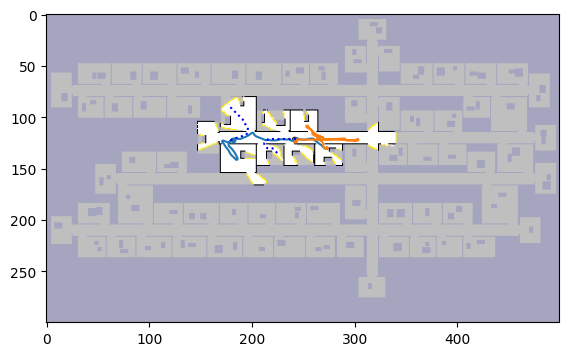

Robot 0 | Subgoal (219, 100) | Dist: 68.97 | Area: 132 | Cost: -591.03
Robot 0 | Subgoal (284, 131) | Dist: 106.14 | Area: 73 | Cost: -258.86
Robot 0 | Subgoal (198, 137) | Dist: 34.97 | Area: 54 | Cost: -235.03
Robot 0 | Subgoal (242, 141) | Dist: 73.56 | Area: 153 | Cost: -691.44
Robot 0 | Subgoal (215, 143) | Dist: 48.56 | Area: 113 | Cost: -516.44
Robot 0 | Subgoal (279, 143) | Dist: 108.04 | Area: 40 | Cost: -91.96
Robot 0 | Subgoal (251, 97) | Dist: 96.21 | Area: 22 | Cost: -13.79
Robot 0 | Subgoal (230, 97) | Dist: 69.80 | Area: 132 | Cost: -590.20
Robot 0 | Subgoal (171, 106) | Dist: 46.56 | Area: 55335 | Cost: -276628.44
Robot 0 | Subgoal (271, 145) | Dist: 106.73 | Area: 40 | Cost: -93.27
Robot 0 | Subgoal (150, 117) | Dist: 35.90 | Area: 38 | Cost: -154.10
Robot 0 | Subgoal (316, 108) | Dist: 140.73 | Area: 55335 | Cost: -276534.27
Robot 0 | Subgoal (151, 125) | Dist: 35.31 | Area: 38 | Cost: -154.69
Robot 0 | Subgoal (254, 129) | Dist: 74.31 | Area: 28 | Cost: -65.69
Robot 

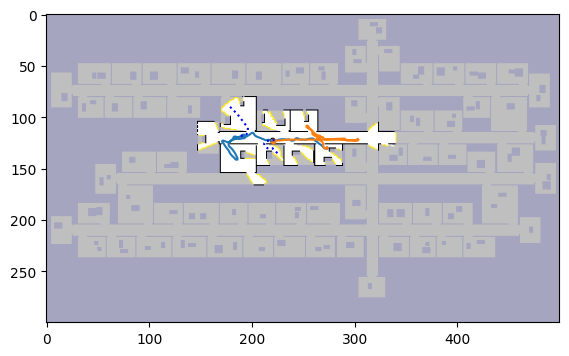

Robot 0 | Subgoal (254, 129) | Dist: 65.97 | Area: 24 | Cost: -54.03
Robot 0 | Subgoal (284, 131) | Dist: 97.80 | Area: 73 | Cost: -267.20
Robot 0 | Subgoal (198, 137) | Dist: 46.63 | Area: 54 | Cost: -223.37
Robot 0 | Subgoal (215, 143) | Dist: 40.21 | Area: 113 | Cost: -524.79
Robot 0 | Subgoal (279, 143) | Dist: 99.70 | Area: 40 | Cost: -100.30
Robot 0 | Subgoal (251, 97) | Dist: 84.56 | Area: 22 | Cost: -25.44
Robot 0 | Subgoal (230, 97) | Dist: 58.14 | Area: 127 | Cost: -576.86
Robot 0 | Subgoal (171, 106) | Dist: 34.90 | Area: 55335 | Cost: -276640.10
Robot 0 | Subgoal (271, 145) | Dist: 98.38 | Area: 40 | Cost: -101.62
Robot 0 | Subgoal (316, 108) | Dist: 129.07 | Area: 55335 | Cost: -276545.93
Robot 0 | Subgoal (151, 125) | Dist: 46.97 | Area: 34 | Cost: -123.03
Robot 0 | Subgoal (317, 129) | Dist: 129.56 | Area: 55335 | Cost: -276545.44
Robot 0 | Subgoal (157, 128) | Dist: 40.97 | Area: 149 | Cost: -704.03
Robot 0 | Subgoal (252, 138) | Dist: 70.28 | Area: 151 | Cost: -684.72


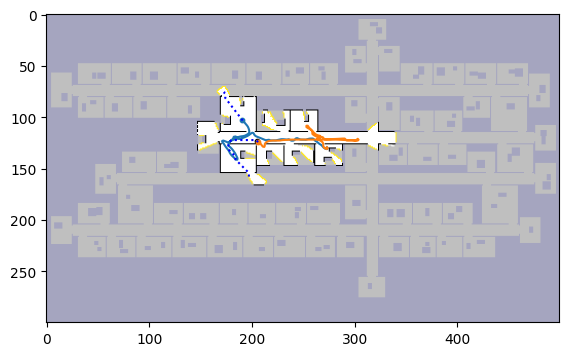

Robot 0 | Subgoal (284, 131) | Dist: 110.60 | Area: 73 | Cost: -254.40
Robot 0 | Subgoal (198, 137) | Dist: 68.36 | Area: 54 | Cost: -201.64
Robot 0 | Subgoal (173, 99) | Dist: 16.66 | Area: 26 | Cost: -113.34
Robot 0 | Subgoal (215, 143) | Dist: 55.36 | Area: 107 | Cost: -479.64
Robot 0 | Subgoal (279, 143) | Dist: 112.50 | Area: 40 | Cost: -87.50
Robot 0 | Subgoal (251, 97) | Dist: 96.53 | Area: 22 | Cost: -13.47
Robot 0 | Subgoal (230, 97) | Dist: 70.11 | Area: 127 | Cost: -564.89
Robot 0 | Subgoal (171, 106) | Dist: 24.14 | Area: 26 | Cost: -105.86
Robot 0 | Subgoal (271, 145) | Dist: 111.18 | Area: 40 | Cost: -88.82
Robot 0 | Subgoal (316, 108) | Dist: 141.04 | Area: 48391 | Cost: -241813.96
Robot 0 | Subgoal (254, 129) | Dist: 79.77 | Area: 22 | Cost: -30.23
Robot 0 | Subgoal (151, 125) | Dist: 68.70 | Area: 34 | Cost: -101.30
Robot 0 | Subgoal (317, 129) | Dist: 142.36 | Area: 48391 | Cost: -241812.64
Robot 0 | Subgoal (170, 72) | Dist: 34.21 | Area: 93551 | Cost: -467720.79
Rob

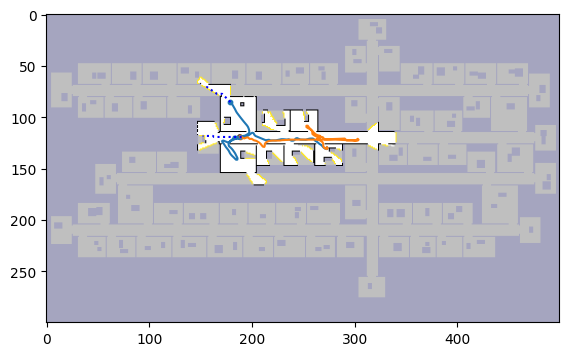

Robot 0 | Subgoal (284, 131) | Dist: 131.57 | Area: 73 | Cost: -233.43
Robot 0 | Subgoal (198, 137) | Dist: 89.33 | Area: 54 | Cost: -180.67
Robot 0 | Subgoal (152, 118) | Dist: 84.11 | Area: 93786 | Cost: -468845.89
Robot 0 | Subgoal (215, 143) | Dist: 76.33 | Area: 107 | Cost: -458.67
Robot 0 | Subgoal (279, 143) | Dist: 133.47 | Area: 40 | Cost: -66.53
Robot 0 | Subgoal (251, 97) | Dist: 117.50 | Area: 22 | Cost: 7.50
Robot 0 | Subgoal (230, 97) | Dist: 91.08 | Area: 127 | Cost: -543.92
Robot 0 | Subgoal (271, 145) | Dist: 132.15 | Area: 40 | Cost: -67.85
Robot 0 | Subgoal (316, 108) | Dist: 162.01 | Area: 48310 | Cost: -241387.99
Robot 0 | Subgoal (254, 129) | Dist: 100.74 | Area: 22 | Cost: -9.26
Robot 0 | Subgoal (151, 125) | Dist: 89.67 | Area: 34 | Cost: -80.33
Robot 0 | Subgoal (317, 129) | Dist: 163.33 | Area: 48310 | Cost: -241386.67
Robot 0 | Subgoal (157, 128) | Dist: 83.67 | Area: 149 | Cost: -661.33
Robot 0 | Subgoal (252, 138) | Dist: 104.05 | Area: 151 | Cost: -650.95


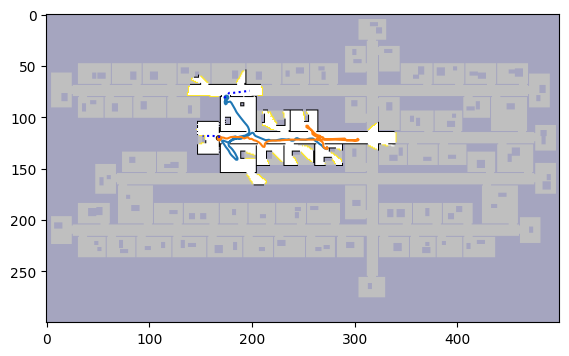

Robot 0 | Subgoal (146, 112) | Dist: 99.01 | Area: 94649 | Cost: -473145.99
Robot 0 | Subgoal (198, 137) | Dist: 96.57 | Area: 54 | Cost: -173.43
Robot 0 | Subgoal (279, 143) | Dist: 140.71 | Area: 40 | Cost: -59.29
Robot 0 | Subgoal (251, 97) | Dist: 124.74 | Area: 22 | Cost: 14.74
Robot 0 | Subgoal (316, 108) | Dist: 169.25 | Area: 47388 | Cost: -236770.75
Robot 0 | Subgoal (254, 129) | Dist: 107.98 | Area: 22 | Cost: -2.02
Robot 0 | Subgoal (142, 80) | Dist: 34.24 | Area: 94649 | Cost: -473210.76
Robot 0 | Subgoal (153, 63) | Dist: 28.97 | Area: 490 | Cost: -2421.03
Robot 0 | Subgoal (197, 160) | Dist: 112.95 | Area: 47388 | Cost: -236827.05
Robot 0 | Subgoal (206, 80) | Dist: 34.24 | Area: 94649 | Cost: -473210.76
Robot 0 | Subgoal (282, 138) | Dist: 138.71 | Area: 73 | Cost: -226.29
Robot 0 | Subgoal (329, 127) | Dist: 182.15 | Area: 441 | Cost: -2022.85
Robot 0 | Subgoal (242, 141) | Dist: 106.23 | Area: 151 | Cost: -648.77
Robot 0 | Subgoal (210, 159) | Dist: 120.27 | Area: 4738

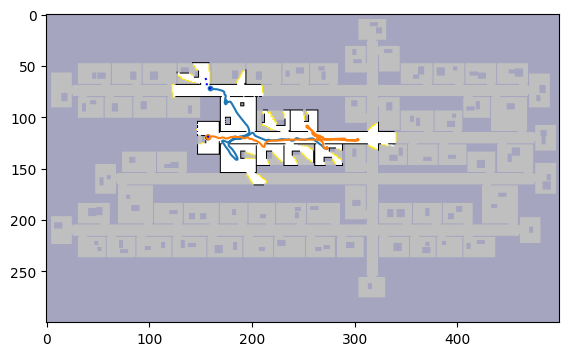

Robot 0 | Subgoal (141, 58) | Dist: 21.73 | Area: 125 | Cost: -603.27
Robot 0 | Subgoal (146, 112) | Dist: 117.57 | Area: 95198 | Cost: -475872.43
Robot 0 | Subgoal (284, 131) | Dist: 157.37 | Area: 73 | Cost: -207.63
Robot 0 | Subgoal (198, 137) | Dist: 115.12 | Area: 54 | Cost: -154.88
Robot 0 | Subgoal (136, 63) | Dist: 23.49 | Area: 95198 | Cost: -475966.51
Robot 0 | Subgoal (144, 51) | Dist: 25.14 | Area: 125 | Cost: -599.86
Robot 0 | Subgoal (210, 74) | Dist: 54.66 | Area: 47388 | Cost: -236885.34
Robot 0 | Subgoal (215, 143) | Dist: 102.12 | Area: 107 | Cost: -432.88
Robot 0 | Subgoal (279, 143) | Dist: 159.27 | Area: 40 | Cost: -40.73
Robot 0 | Subgoal (251, 97) | Dist: 143.30 | Area: 22 | Cost: 33.30
Robot 0 | Subgoal (230, 97) | Dist: 116.88 | Area: 127 | Cost: -518.12
Robot 0 | Subgoal (271, 145) | Dist: 157.95 | Area: 40 | Cost: -42.05
Robot 0 | Subgoal (316, 108) | Dist: 187.81 | Area: 47388 | Cost: -236752.19
Robot 0 | Subgoal (254, 129) | Dist: 126.54 | Area: 22 | Cost: 

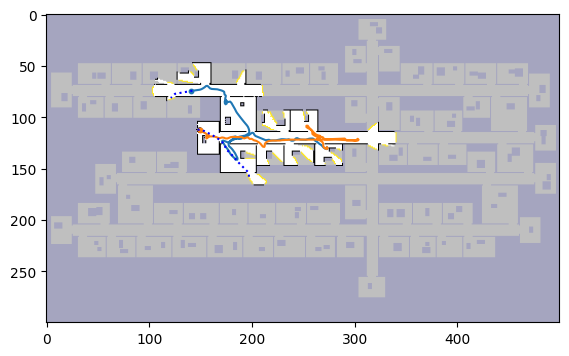

Robot 0 | Subgoal (108, 65) | Dist: 34.73 | Area: 516 | Cost: -2545.27
Robot 0 | Subgoal (284, 131) | Dist: 173.30 | Area: 73 | Cost: -191.70
Robot 0 | Subgoal (198, 137) | Dist: 131.05 | Area: 54 | Cost: -138.95
Robot 0 | Subgoal (144, 51) | Dist: 37.56 | Area: 118 | Cost: -552.44
Robot 0 | Subgoal (210, 74) | Dist: 71.41 | Area: 47388 | Cost: -236868.59
Robot 0 | Subgoal (215, 143) | Dist: 118.05 | Area: 107 | Cost: -416.95
Robot 0 | Subgoal (279, 143) | Dist: 175.20 | Area: 40 | Cost: -24.80
Robot 0 | Subgoal (251, 97) | Dist: 159.23 | Area: 22 | Cost: 49.23
Robot 0 | Subgoal (230, 97) | Dist: 132.81 | Area: 127 | Cost: -502.19
Robot 0 | Subgoal (141, 57) | Dist: 35.14 | Area: 118 | Cost: -554.86
Robot 0 | Subgoal (271, 145) | Dist: 173.88 | Area: 40 | Cost: -26.12
Robot 0 | Subgoal (316, 108) | Dist: 203.74 | Area: 47388 | Cost: -236736.26
Robot 0 | Subgoal (103, 74) | Dist: 36.41 | Area: 4146 | Cost: -20693.59
Robot 0 | Subgoal (254, 129) | Dist: 142.47 | Area: 22 | Cost: 32.47
Ro

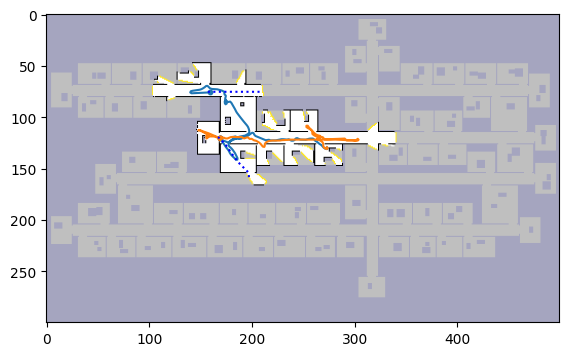

Robot 0 | Subgoal (108, 65) | Dist: 55.73 | Area: 515 | Cost: -2519.27
Robot 0 | Subgoal (284, 131) | Dist: 152.30 | Area: 73 | Cost: -212.70
Robot 0 | Subgoal (198, 137) | Dist: 110.05 | Area: 54 | Cost: -159.95
Robot 0 | Subgoal (144, 51) | Dist: 31.38 | Area: 118 | Cost: -558.62
Robot 0 | Subgoal (210, 74) | Dist: 50.41 | Area: 47388 | Cost: -236889.59
Robot 0 | Subgoal (215, 143) | Dist: 97.05 | Area: 107 | Cost: -437.95
Robot 0 | Subgoal (279, 143) | Dist: 154.20 | Area: 40 | Cost: -45.80
Robot 0 | Subgoal (251, 97) | Dist: 138.23 | Area: 22 | Cost: 28.23
Robot 0 | Subgoal (230, 97) | Dist: 111.81 | Area: 127 | Cost: -523.19
Robot 0 | Subgoal (141, 57) | Dist: 28.97 | Area: 118 | Cost: -561.03
Robot 0 | Subgoal (271, 145) | Dist: 152.88 | Area: 40 | Cost: -47.12
Robot 0 | Subgoal (316, 108) | Dist: 182.74 | Area: 47388 | Cost: -236757.26
Robot 0 | Subgoal (103, 74) | Dist: 57.41 | Area: 4146 | Cost: -20672.59
Robot 0 | Subgoal (254, 129) | Dist: 121.47 | Area: 22 | Cost: 11.47
Rob

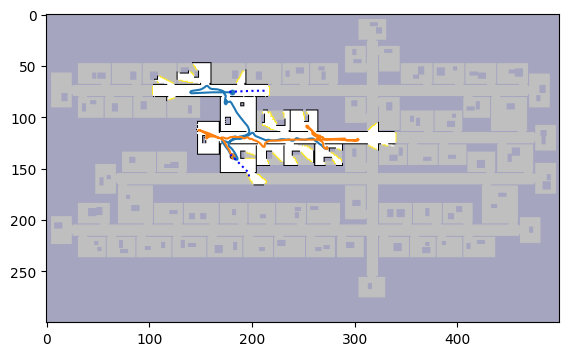

Robot 0 | Subgoal (108, 65) | Dist: 77.73 | Area: 515 | Cost: -2497.27
Robot 0 | Subgoal (284, 131) | Dist: 143.23 | Area: 73 | Cost: -221.77
Robot 0 | Subgoal (188, 57) | Dist: 20.49 | Area: 468 | Cost: -2319.51
Robot 0 | Subgoal (198, 137) | Dist: 100.98 | Area: 54 | Cost: -169.02
Robot 0 | Subgoal (144, 51) | Dist: 51.63 | Area: 118 | Cost: -538.37
Robot 0 | Subgoal (215, 143) | Dist: 87.98 | Area: 107 | Cost: -447.02
Robot 0 | Subgoal (279, 143) | Dist: 145.12 | Area: 40 | Cost: -54.88
Robot 0 | Subgoal (251, 97) | Dist: 129.15 | Area: 22 | Cost: 19.15
Robot 0 | Subgoal (230, 97) | Dist: 102.74 | Area: 127 | Cost: -532.26
Robot 0 | Subgoal (141, 57) | Dist: 50.38 | Area: 118 | Cost: -539.62
Robot 0 | Subgoal (271, 145) | Dist: 143.81 | Area: 40 | Cost: -56.19
Robot 0 | Subgoal (316, 108) | Dist: 173.67 | Area: 47283 | Cost: -236241.33
Robot 0 | Subgoal (103, 74) | Dist: 79.41 | Area: 4146 | Cost: -20650.59
Robot 0 | Subgoal (254, 129) | Dist: 112.40 | Area: 22 | Cost: 2.40
Robot 0 

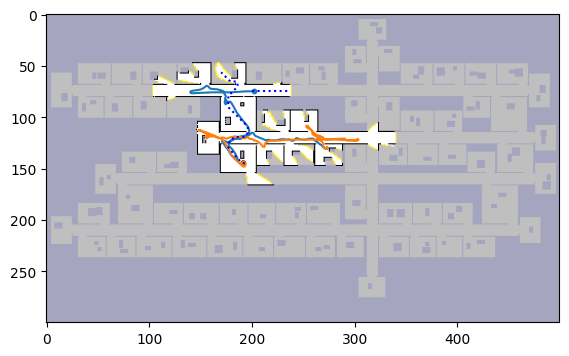

Robot 0 | Subgoal (108, 65) | Dist: 97.90 | Area: 515 | Cost: -2477.10
Robot 0 | Subgoal (284, 131) | Dist: 165.05 | Area: 73 | Cost: -199.95
Robot 0 | Subgoal (144, 51) | Dist: 71.80 | Area: 118 | Cost: -518.20
Robot 0 | Subgoal (215, 143) | Dist: 109.81 | Area: 107 | Cost: -425.19
Robot 0 | Subgoal (279, 143) | Dist: 166.95 | Area: 40 | Cost: -33.05
Robot 0 | Subgoal (251, 97) | Dist: 150.98 | Area: 22 | Cost: 40.98
Robot 0 | Subgoal (230, 97) | Dist: 124.57 | Area: 127 | Cost: -510.43
Robot 0 | Subgoal (212, 159) | Dist: 148.10 | Area: 46388 | Cost: -231791.90
Robot 0 | Subgoal (141, 57) | Dist: 70.56 | Area: 118 | Cost: -519.44
Robot 0 | Subgoal (170, 56) | Dist: 40.21 | Area: 96313 | Cost: -481524.79
Robot 0 | Subgoal (271, 145) | Dist: 165.64 | Area: 40 | Cost: -34.36
Robot 0 | Subgoal (316, 108) | Dist: 195.50 | Area: 46388 | Cost: -231744.50
Robot 0 | Subgoal (103, 74) | Dist: 100.41 | Area: 4146 | Cost: -20629.59
Robot 0 | Subgoal (254, 129) | Dist: 134.23 | Area: 22 | Cost: 2

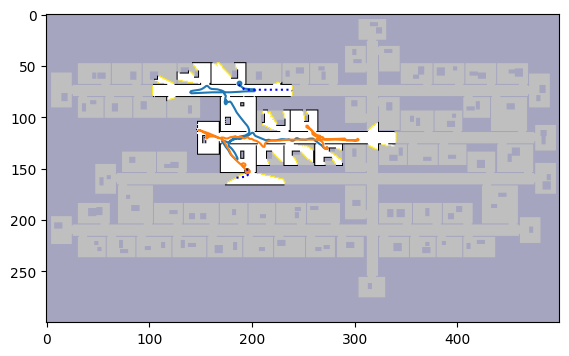

Robot 0 | Subgoal (108, 65) | Dist: 83.90 | Area: 515 | Cost: -2491.10
Robot 0 | Subgoal (284, 131) | Dist: 154.12 | Area: 73 | Cost: -210.88
Robot 0 | Subgoal (144, 51) | Dist: 57.80 | Area: 118 | Cost: -532.20
Robot 0 | Subgoal (183, 159) | Dist: 138.10 | Area: 46139 | Cost: -230556.90
Robot 0 | Subgoal (215, 143) | Dist: 98.88 | Area: 107 | Cost: -436.12
Robot 0 | Subgoal (279, 143) | Dist: 156.02 | Area: 40 | Cost: -43.98
Robot 0 | Subgoal (251, 97) | Dist: 140.05 | Area: 22 | Cost: 30.05
Robot 0 | Subgoal (230, 97) | Dist: 113.64 | Area: 127 | Cost: -521.36
Robot 0 | Subgoal (221, 158) | Dist: 145.75 | Area: 46139 | Cost: -230549.25
Robot 0 | Subgoal (141, 57) | Dist: 56.56 | Area: 118 | Cost: -533.44
Robot 0 | Subgoal (271, 145) | Dist: 154.71 | Area: 40 | Cost: -45.29
Robot 0 | Subgoal (316, 108) | Dist: 184.57 | Area: 46139 | Cost: -230510.43
Robot 0 | Subgoal (103, 74) | Dist: 88.90 | Area: 4146 | Cost: -20641.10
Robot 0 | Subgoal (254, 129) | Dist: 123.30 | Area: 22 | Cost: 1

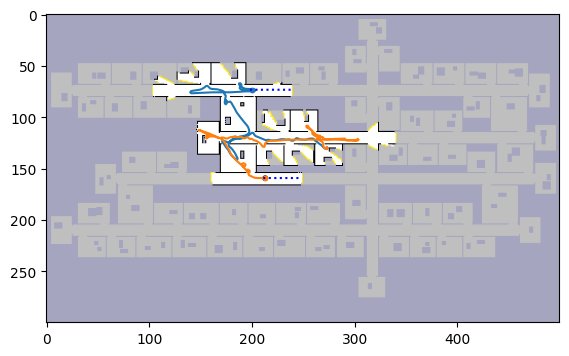

Robot 0 | Subgoal (250, 159) | Dist: 186.10 | Area: 97220 | Cost: -485913.90
Robot 0 | Subgoal (108, 65) | Dist: 96.90 | Area: 515 | Cost: -2478.10
Robot 0 | Subgoal (284, 131) | Dist: 164.05 | Area: 73 | Cost: -200.95
Robot 0 | Subgoal (174, 54) | Dist: 38.80 | Area: 115 | Cost: -536.20
Robot 0 | Subgoal (144, 51) | Dist: 70.80 | Area: 118 | Cost: -519.20
Robot 0 | Subgoal (215, 143) | Dist: 108.81 | Area: 107 | Cost: -426.19
Robot 0 | Subgoal (279, 143) | Dist: 165.95 | Area: 40 | Cost: -34.05
Robot 0 | Subgoal (251, 97) | Dist: 149.98 | Area: 22 | Cost: 39.98
Robot 0 | Subgoal (230, 97) | Dist: 123.57 | Area: 127 | Cost: -511.43
Robot 0 | Subgoal (141, 57) | Dist: 69.56 | Area: 118 | Cost: -520.44
Robot 0 | Subgoal (271, 145) | Dist: 164.64 | Area: 40 | Cost: -35.36
Robot 0 | Subgoal (316, 108) | Dist: 194.50 | Area: 45613 | Cost: -227870.50
Robot 0 | Subgoal (103, 74) | Dist: 99.41 | Area: 4146 | Cost: -20630.59
Robot 0 | Subgoal (254, 129) | Dist: 133.23 | Area: 22 | Cost: 23.23
R

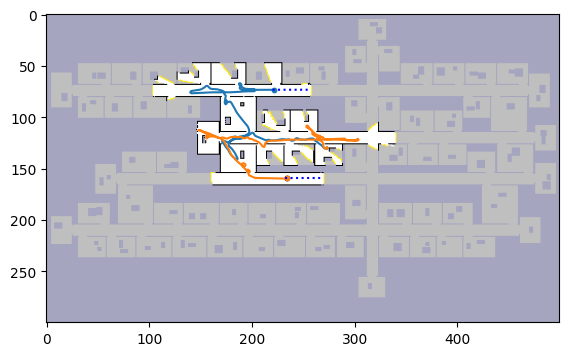

Robot 0 | Subgoal (108, 65) | Dist: 117.90 | Area: 515 | Cost: -2457.10
Robot 0 | Subgoal (279, 143) | Dist: 186.95 | Area: 40 | Cost: -13.05
Robot 0 | Subgoal (210, 57) | Dist: 21.14 | Area: 248 | Cost: -1218.86
Robot 0 | Subgoal (251, 97) | Dist: 170.98 | Area: 22 | Cost: 60.98
Robot 0 | Subgoal (141, 57) | Dist: 90.56 | Area: 118 | Cost: -499.44
Robot 0 | Subgoal (316, 108) | Dist: 215.50 | Area: 44703 | Cost: -223299.50
Robot 0 | Subgoal (103, 74) | Dist: 120.41 | Area: 4146 | Cost: -20609.59
Robot 0 | Subgoal (254, 129) | Dist: 154.23 | Area: 22 | Cost: 44.23
Robot 0 | Subgoal (116, 63) | Dist: 110.14 | Area: 515 | Cost: -2464.86
Robot 0 | Subgoal (184, 50) | Dist: 55.73 | Area: 115 | Cost: -519.27
Robot 0 | Subgoal (160, 158) | Dist: 190.61 | Area: 44703 | Cost: -223324.39
Robot 0 | Subgoal (329, 127) | Dist: 228.40 | Area: 441 | Cost: -1976.60
Robot 0 | Subgoal (282, 138) | Dist: 184.95 | Area: 73 | Cost: -180.05
Robot 0 | Subgoal (242, 141) | Dist: 152.47 | Area: 151 | Cost: -6

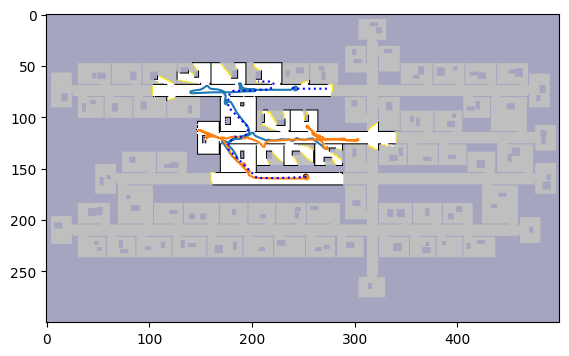

Robot 0 | Subgoal (206, 65) | Dist: 38.49 | Area: 98590 | Cost: -492911.51
Robot 0 | Subgoal (108, 65) | Dist: 137.49 | Area: 515 | Cost: -2437.51
Robot 0 | Subgoal (279, 143) | Dist: 207.37 | Area: 40 | Cost: 7.37
Robot 0 | Subgoal (251, 97) | Dist: 191.40 | Area: 22 | Cost: 81.40
Robot 0 | Subgoal (289, 160) | Dist: 265.92 | Area: 44281 | Cost: -221139.08
Robot 0 | Subgoal (141, 57) | Dist: 110.14 | Area: 118 | Cost: -479.86
Robot 0 | Subgoal (316, 108) | Dist: 235.91 | Area: 44281 | Cost: -221169.09
Robot 0 | Subgoal (103, 74) | Dist: 140.83 | Area: 4146 | Cost: -20589.17
Robot 0 | Subgoal (254, 129) | Dist: 174.64 | Area: 22 | Cost: 64.64
Robot 0 | Subgoal (116, 63) | Dist: 129.73 | Area: 515 | Cost: -2445.27
Robot 0 | Subgoal (184, 50) | Dist: 75.31 | Area: 115 | Cost: -499.69
Robot 0 | Subgoal (160, 158) | Dist: 211.02 | Area: 44281 | Cost: -221193.98
Robot 0 | Subgoal (329, 127) | Dist: 248.81 | Area: 441 | Cost: -1956.19
Robot 0 | Subgoal (282, 138) | Dist: 205.37 | Area: 73 | 

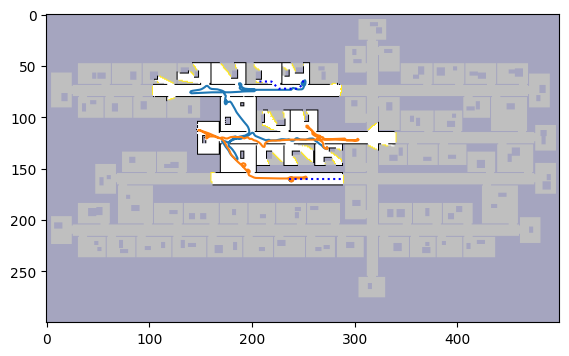

Robot 0 | Subgoal (206, 65) | Dist: 45.49 | Area: 99005 | Cost: -494979.51
Robot 0 | Subgoal (108, 65) | Dist: 144.49 | Area: 515 | Cost: -2430.51
Robot 0 | Subgoal (240, 51) | Dist: 18.73 | Area: 49 | Cost: -226.27
Robot 0 | Subgoal (279, 143) | Dist: 216.02 | Area: 40 | Cost: 16.02
Robot 0 | Subgoal (251, 97) | Dist: 200.05 | Area: 22 | Cost: 90.05
Robot 0 | Subgoal (278, 67) | Dist: 32.49 | Area: 443 | Cost: -2182.51
Robot 0 | Subgoal (289, 160) | Dist: 274.58 | Area: 43734 | Cost: -218395.42
Robot 0 | Subgoal (141, 57) | Dist: 117.14 | Area: 118 | Cost: -472.86
Robot 0 | Subgoal (316, 108) | Dist: 244.57 | Area: 43734 | Cost: -218425.43
Robot 0 | Subgoal (103, 74) | Dist: 149.49 | Area: 4146 | Cost: -20580.51
Robot 0 | Subgoal (254, 129) | Dist: 183.30 | Area: 22 | Cost: 73.30
Robot 0 | Subgoal (116, 63) | Dist: 136.73 | Area: 515 | Cost: -2438.27
Robot 0 | Subgoal (250, 49) | Dist: 20.66 | Area: 49 | Cost: -224.34
Robot 0 | Subgoal (184, 50) | Dist: 82.31 | Area: 115 | Cost: -492.

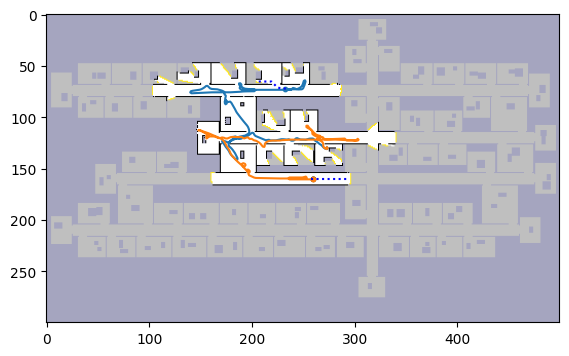

Robot 0 | Subgoal (108, 65) | Dist: 123.49 | Area: 515 | Cost: -2451.51
Robot 0 | Subgoal (203, 51) | Dist: 33.28 | Area: 162 | Cost: -776.72
Robot 0 | Subgoal (240, 51) | Dist: 40.56 | Area: 49 | Cost: -204.44
Robot 0 | Subgoal (279, 143) | Dist: 193.37 | Area: 40 | Cost: -6.63
Robot 0 | Subgoal (251, 97) | Dist: 177.40 | Area: 22 | Cost: 67.40
Robot 0 | Subgoal (278, 67) | Dist: 52.07 | Area: 443 | Cost: -2162.93
Robot 0 | Subgoal (141, 57) | Dist: 96.14 | Area: 118 | Cost: -493.86
Robot 0 | Subgoal (316, 108) | Dist: 221.91 | Area: 43630 | Cost: -217928.09
Robot 0 | Subgoal (103, 74) | Dist: 126.83 | Area: 4146 | Cost: -20603.17
Robot 0 | Subgoal (254, 129) | Dist: 160.64 | Area: 22 | Cost: 50.64
Robot 0 | Subgoal (116, 63) | Dist: 115.73 | Area: 515 | Cost: -2459.27
Robot 0 | Subgoal (250, 49) | Dist: 43.31 | Area: 49 | Cost: -201.69
Robot 0 | Subgoal (184, 50) | Dist: 61.31 | Area: 115 | Cost: -513.69
Robot 0 | Subgoal (160, 158) | Dist: 197.02 | Area: 43630 | Cost: -217952.98
Rob

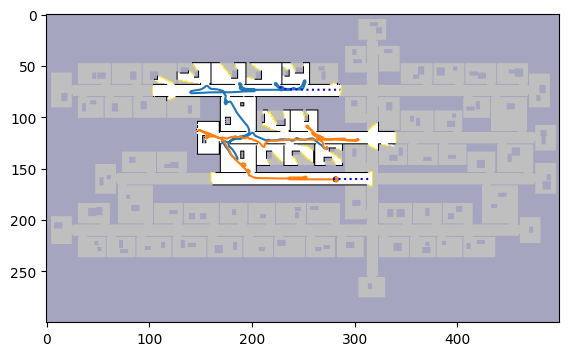

Robot 0 | Subgoal (108, 65) | Dist: 124.49 | Area: 515 | Cost: -2450.51
Robot 0 | Subgoal (240, 51) | Dist: 39.56 | Area: 49 | Cost: -205.44
Robot 0 | Subgoal (279, 143) | Dist: 194.37 | Area: 40 | Cost: -5.63
Robot 0 | Subgoal (251, 97) | Dist: 178.40 | Area: 22 | Cost: 68.40
Robot 0 | Subgoal (278, 67) | Dist: 51.07 | Area: 443 | Cost: -2163.93
Robot 0 | Subgoal (141, 57) | Dist: 97.14 | Area: 118 | Cost: -492.86
Robot 0 | Subgoal (316, 108) | Dist: 222.91 | Area: 43351 | Cost: -216532.09
Robot 0 | Subgoal (103, 74) | Dist: 127.83 | Area: 4146 | Cost: -20602.17
Robot 0 | Subgoal (254, 129) | Dist: 161.64 | Area: 22 | Cost: 51.64
Robot 0 | Subgoal (116, 63) | Dist: 116.73 | Area: 515 | Cost: -2458.27
Robot 0 | Subgoal (250, 49) | Dist: 42.31 | Area: 49 | Cost: -202.69
Robot 0 | Subgoal (184, 50) | Dist: 62.31 | Area: 115 | Cost: -512.69
Robot 0 | Subgoal (160, 158) | Dist: 198.02 | Area: 43351 | Cost: -216556.98
Robot 0 | Subgoal (198, 61) | Dist: 36.14 | Area: 117 | Cost: -548.86
Rob

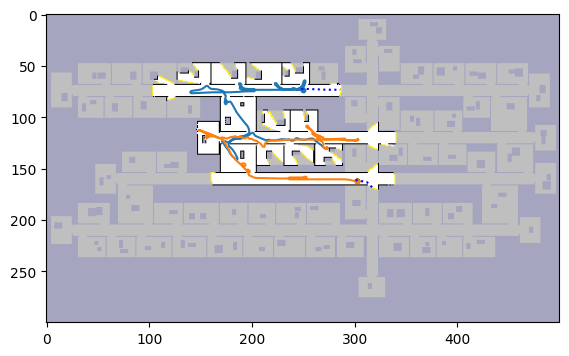

Robot 0 | Subgoal (108, 65) | Dist: 145.49 | Area: 515 | Cost: -2429.51
Robot 0 | Subgoal (317, 169) | Dist: 306.24 | Area: 42324 | Cost: -211313.76
Robot 0 | Subgoal (240, 51) | Dist: 24.56 | Area: 49 | Cost: -220.44
Robot 0 | Subgoal (279, 143) | Dist: 215.37 | Area: 40 | Cost: 15.37
Robot 0 | Subgoal (251, 97) | Dist: 199.40 | Area: 22 | Cost: 89.40
Robot 0 | Subgoal (340, 160) | Dist: 325.92 | Area: 99783 | Cost: -498589.08
Robot 0 | Subgoal (141, 57) | Dist: 118.14 | Area: 118 | Cost: -471.86
Robot 0 | Subgoal (316, 108) | Dist: 243.91 | Area: 42324 | Cost: -211376.09
Robot 0 | Subgoal (103, 74) | Dist: 148.83 | Area: 4146 | Cost: -20581.17
Robot 0 | Subgoal (254, 129) | Dist: 182.64 | Area: 22 | Cost: 72.64
Robot 0 | Subgoal (279, 67) | Dist: 30.07 | Area: 441 | Cost: -2174.93
Robot 0 | Subgoal (116, 63) | Dist: 137.73 | Area: 515 | Cost: -2437.27
Robot 0 | Subgoal (250, 49) | Dist: 24.83 | Area: 49 | Cost: -220.17
Robot 0 | Subgoal (184, 50) | Dist: 83.31 | Area: 115 | Cost: -49

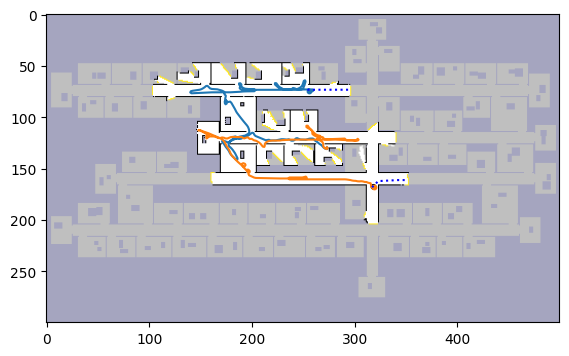

Robot 0 | Subgoal (108, 65) | Dist: 152.31 | Area: 515 | Cost: -2422.69
Robot 0 | Subgoal (305, 143) | Dist: 273.81 | Area: 343 | Cost: -1441.19
Robot 0 | Subgoal (240, 51) | Dist: 29.63 | Area: 48 | Cost: -210.37
Robot 0 | Subgoal (279, 143) | Dist: 220.54 | Area: 40 | Cost: 20.54
Robot 0 | Subgoal (251, 97) | Dist: 204.57 | Area: 22 | Cost: 94.57
Robot 0 | Subgoal (141, 57) | Dist: 124.97 | Area: 118 | Cost: -465.03
Robot 0 | Subgoal (316, 108) | Dist: 249.08 | Area: 41068 | Cost: -205090.92
Robot 0 | Subgoal (103, 74) | Dist: 154.00 | Area: 4146 | Cost: -20576.00
Robot 0 | Subgoal (254, 129) | Dist: 187.81 | Area: 22 | Cost: 77.81
Robot 0 | Subgoal (116, 63) | Dist: 144.56 | Area: 515 | Cost: -2430.44
Robot 0 | Subgoal (184, 50) | Dist: 90.14 | Area: 115 | Cost: -484.86
Robot 0 | Subgoal (160, 158) | Dist: 224.20 | Area: 41068 | Cost: -205115.80
Robot 0 | Subgoal (198, 61) | Dist: 63.97 | Area: 117 | Cost: -521.03
Robot 0 | Subgoal (306, 131) | Dist: 286.40 | Area: 100824 | Cost: -5

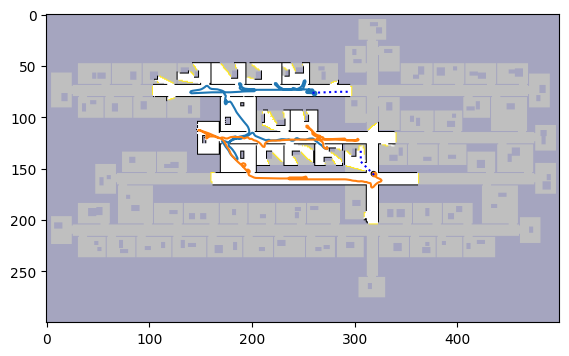

Robot 0 | Subgoal (108, 65) | Dist: 157.73 | Area: 515 | Cost: -2417.27
Robot 0 | Subgoal (279, 65) | Dist: 22.31 | Area: 428 | Cost: -2117.69
Robot 0 | Subgoal (240, 51) | Dist: 35.04 | Area: 47 | Cost: -199.96
Robot 0 | Subgoal (279, 143) | Dist: 225.12 | Area: 40 | Cost: 25.12
Robot 0 | Subgoal (251, 97) | Dist: 209.15 | Area: 22 | Cost: 99.15
Robot 0 | Subgoal (141, 57) | Dist: 130.38 | Area: 118 | Cost: -459.62
Robot 0 | Subgoal (316, 108) | Dist: 253.67 | Area: 40954 | Cost: -204516.33
Robot 0 | Subgoal (103, 74) | Dist: 159.41 | Area: 4146 | Cost: -20570.59
Robot 0 | Subgoal (254, 129) | Dist: 192.40 | Area: 22 | Cost: 82.40
Robot 0 | Subgoal (116, 63) | Dist: 149.97 | Area: 515 | Cost: -2425.03
Robot 0 | Subgoal (362, 159) | Dist: 324.71 | Area: 40954 | Cost: -204445.29
Robot 0 | Subgoal (184, 50) | Dist: 95.56 | Area: 115 | Cost: -479.44
Robot 0 | Subgoal (160, 158) | Dist: 228.78 | Area: 40954 | Cost: -204541.22
Robot 0 | Subgoal (198, 61) | Dist: 69.38 | Area: 117 | Cost: -5

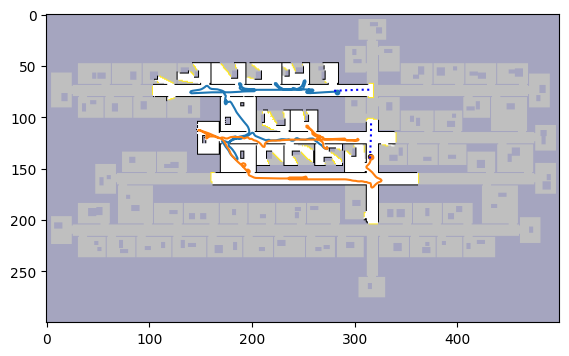

Robot 0 | Subgoal (108, 65) | Dist: 179.31 | Area: 515 | Cost: -2395.69
Robot 0 | Subgoal (240, 51) | Dist: 56.63 | Area: 47 | Cost: -178.37
Robot 0 | Subgoal (279, 143) | Dist: 247.54 | Area: 40 | Cost: 47.54
Robot 0 | Subgoal (251, 97) | Dist: 231.57 | Area: 22 | Cost: 121.57
Robot 0 | Subgoal (141, 57) | Dist: 151.97 | Area: 118 | Cost: -438.03
Robot 0 | Subgoal (299, 128) | Dist: 319.47 | Area: 58 | Cost: 29.47
Robot 0 | Subgoal (103, 74) | Dist: 181.00 | Area: 4146 | Cost: -20549.00
Robot 0 | Subgoal (254, 129) | Dist: 214.81 | Area: 22 | Cost: 104.81
Robot 0 | Subgoal (116, 63) | Dist: 171.56 | Area: 515 | Cost: -2403.44
Robot 0 | Subgoal (362, 159) | Dist: 347.12 | Area: 40581 | Cost: -202557.88
Robot 0 | Subgoal (184, 50) | Dist: 117.14 | Area: 115 | Cost: -457.86
Robot 0 | Subgoal (160, 158) | Dist: 251.20 | Area: 40581 | Cost: -202653.80
Robot 0 | Subgoal (198, 61) | Dist: 90.97 | Area: 117 | Cost: -494.03
Robot 0 | Subgoal (329, 127) | Dist: 288.98 | Area: 428 | Cost: -1851.

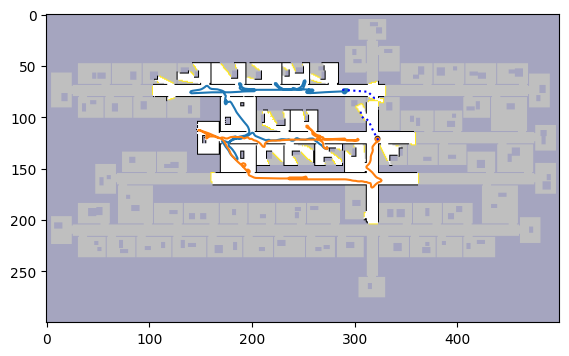

Robot 0 | Subgoal (108, 65) | Dist: 186.31 | Area: 515 | Cost: -2388.69
Robot 0 | Subgoal (262, 59) | Dist: 36.38 | Area: 118 | Cost: -553.62
Robot 0 | Subgoal (240, 51) | Dist: 63.63 | Area: 47 | Cost: -171.37
Robot 0 | Subgoal (279, 143) | Dist: 132.94 | Area: 40 | Cost: -67.06
Robot 0 | Subgoal (251, 97) | Dist: 138.28 | Area: 22 | Cost: 28.28
Robot 0 | Subgoal (357, 122) | Dist: 105.28 | Area: 102775 | Cost: -513769.72
Robot 0 | Subgoal (141, 57) | Dist: 158.97 | Area: 118 | Cost: -431.03
Robot 0 | Subgoal (299, 128) | Dist: 119.80 | Area: 58 | Cost: -170.20
Robot 0 | Subgoal (328, 135) | Dist: 86.87 | Area: 243 | Cost: -1128.13
Robot 0 | Subgoal (103, 74) | Dist: 188.00 | Area: 4146 | Cost: -20542.00
Robot 0 | Subgoal (254, 129) | Dist: 158.46 | Area: 22 | Cost: 48.46
Robot 0 | Subgoal (262, 65) | Dist: 32.73 | Area: 19 | Cost: -62.27
Robot 0 | Subgoal (116, 63) | Dist: 178.56 | Area: 515 | Cost: -2396.44
Robot 0 | Subgoal (362, 159) | Dist: 146.63 | Area: 37096 | Cost: -185333.37

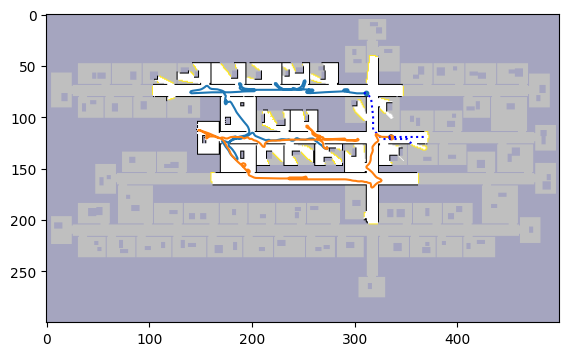

Robot 0 | Subgoal (303, 97) | Dist: 32.83 | Area: 315 | Cost: -1542.17
Robot 0 | Subgoal (108, 65) | Dist: 207.73 | Area: 515 | Cost: -2367.27
Robot 0 | Subgoal (348, 74) | Dist: 36.41 | Area: 36177 | Cost: -180848.59
Robot 0 | Subgoal (262, 59) | Dist: 57.80 | Area: 118 | Cost: -532.20
Robot 0 | Subgoal (240, 51) | Dist: 85.04 | Area: 47 | Cost: -149.96
Robot 0 | Subgoal (279, 143) | Dist: 111.87 | Area: 40 | Cost: -88.13
Robot 0 | Subgoal (251, 97) | Dist: 117.21 | Area: 22 | Cost: 7.21
Robot 0 | Subgoal (141, 57) | Dist: 180.38 | Area: 118 | Cost: -409.62
Robot 0 | Subgoal (299, 128) | Dist: 98.73 | Area: 58 | Cost: -191.27
Robot 0 | Subgoal (103, 74) | Dist: 209.41 | Area: 4146 | Cost: -20520.59
Robot 0 | Subgoal (254, 129) | Dist: 137.38 | Area: 22 | Cost: 27.38
Robot 0 | Subgoal (262, 65) | Dist: 54.14 | Area: 19 | Cost: -40.86
Robot 0 | Subgoal (329, 82) | Dist: 21.31 | Area: 424 | Cost: -2098.69
Robot 0 | Subgoal (116, 63) | Dist: 199.97 | Area: 515 | Cost: -2375.03
Robot 0 | S

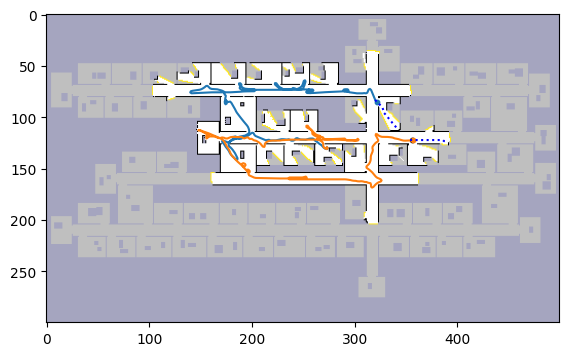

Robot 0 | Subgoal (108, 65) | Dist: 221.46 | Area: 515 | Cost: -2353.54
Robot 0 | Subgoal (354, 73) | Dist: 40.90 | Area: 34762 | Cost: -173769.10
Robot 0 | Subgoal (262, 59) | Dist: 71.53 | Area: 118 | Cost: -518.47
Robot 0 | Subgoal (240, 51) | Dist: 98.77 | Area: 47 | Cost: -136.23
Robot 0 | Subgoal (279, 143) | Dist: 106.18 | Area: 40 | Cost: -93.82
Robot 0 | Subgoal (251, 97) | Dist: 111.53 | Area: 22 | Cost: 1.53
Robot 0 | Subgoal (377, 141) | Dist: 100.36 | Area: 50 | Cost: -149.64
Robot 0 | Subgoal (141, 57) | Dist: 194.11 | Area: 118 | Cost: -395.89
Robot 0 | Subgoal (299, 128) | Dist: 93.04 | Area: 58 | Cost: -196.96
Robot 0 | Subgoal (103, 74) | Dist: 223.14 | Area: 4146 | Cost: -20506.86
Robot 0 | Subgoal (254, 129) | Dist: 131.70 | Area: 22 | Cost: 21.70
Robot 0 | Subgoal (262, 65) | Dist: 67.87 | Area: 19 | Cost: -27.13
Robot 0 | Subgoal (302, 97) | Dist: 27.14 | Area: 296 | Cost: -1452.86
Robot 0 | Subgoal (116, 63) | Dist: 213.70 | Area: 515 | Cost: -2361.30
Robot 0 | S

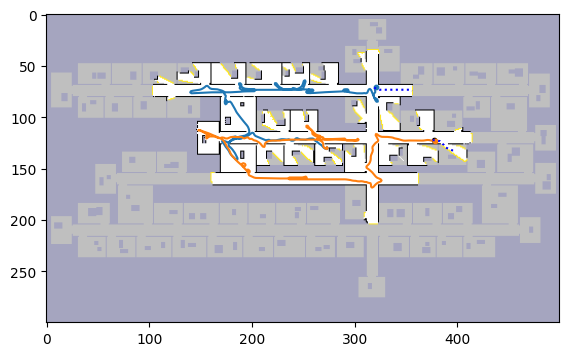

Robot 0 | Subgoal (403, 129) | Dist: 133.80 | Area: 21 | Cost: 28.80
Robot 0 | Subgoal (108, 65) | Dist: 215.07 | Area: 515 | Cost: -2359.93
Robot 0 | Subgoal (356, 74) | Dist: 38.07 | Area: 105853 | Cost: -529226.93
Robot 0 | Subgoal (262, 59) | Dist: 65.14 | Area: 118 | Cost: -524.86
Robot 0 | Subgoal (240, 51) | Dist: 92.38 | Area: 47 | Cost: -142.62
Robot 0 | Subgoal (279, 143) | Dist: 120.77 | Area: 40 | Cost: -79.23
Robot 0 | Subgoal (251, 97) | Dist: 126.11 | Area: 22 | Cost: 16.11
Robot 0 | Subgoal (377, 141) | Dist: 114.94 | Area: 50 | Cost: -135.06
Robot 0 | Subgoal (308, 51) | Dist: 24.56 | Area: 387 | Cost: -1910.44
Robot 0 | Subgoal (141, 57) | Dist: 187.73 | Area: 118 | Cost: -402.27
Robot 0 | Subgoal (299, 128) | Dist: 107.63 | Area: 58 | Cost: -182.37
Robot 0 | Subgoal (360, 97) | Dist: 118.31 | Area: 269 | Cost: -1226.69
Robot 0 | Subgoal (103, 74) | Dist: 220.07 | Area: 4146 | Cost: -20509.93
Robot 0 | Subgoal (254, 129) | Dist: 146.28 | Area: 22 | Cost: 36.28
Robot 0

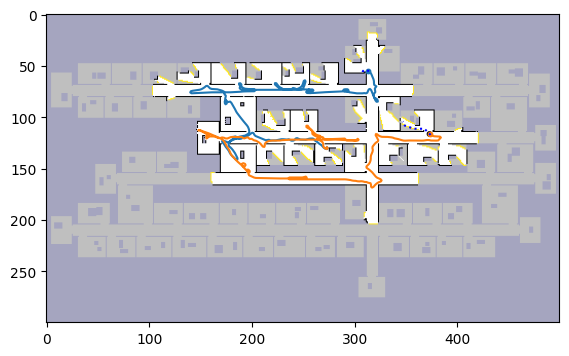

Robot 0 | Subgoal (294, 44) | Dist: 21.90 | Area: 135 | Cost: -653.10
Robot 0 | Subgoal (403, 129) | Dist: 153.94 | Area: 21 | Cost: 48.94
Robot 0 | Subgoal (108, 65) | Dist: 223.90 | Area: 515 | Cost: -2351.10
Robot 0 | Subgoal (356, 74) | Dist: 58.21 | Area: 106631 | Cost: -533096.79
Robot 0 | Subgoal (359, 97) | Dist: 139.46 | Area: 135 | Cost: -535.54
Robot 0 | Subgoal (262, 59) | Dist: 73.97 | Area: 118 | Cost: -516.03
Robot 0 | Subgoal (352, 110) | Dist: 134.38 | Area: 106631 | Cost: -533020.62
Robot 0 | Subgoal (240, 51) | Dist: 101.21 | Area: 47 | Cost: -133.79
Robot 0 | Subgoal (279, 143) | Dist: 134.28 | Area: 40 | Cost: -65.72
Robot 0 | Subgoal (251, 97) | Dist: 139.63 | Area: 22 | Cost: 29.63
Robot 0 | Subgoal (377, 141) | Dist: 135.08 | Area: 49 | Cost: -109.92
Robot 0 | Subgoal (141, 57) | Dist: 196.56 | Area: 118 | Cost: -393.44
Robot 0 | Subgoal (299, 128) | Dist: 121.14 | Area: 58 | Cost: -168.86
Robot 0 | Subgoal (337, 98) | Dist: 59.53 | Area: 113 | Cost: -505.47
Rob

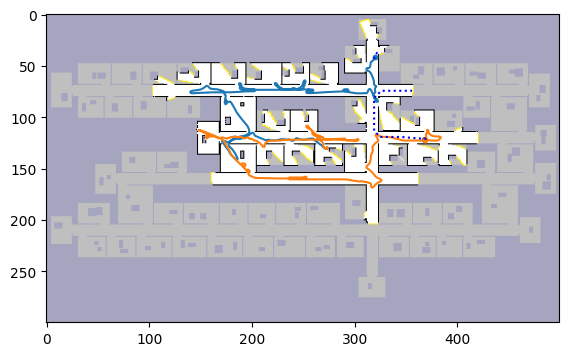

Robot 0 | Subgoal (294, 44) | Dist: 33.56 | Area: 130 | Cost: -616.44
Robot 0 | Subgoal (400, 111) | Dist: 159.49 | Area: 423 | Cost: -1955.51
Robot 0 | Subgoal (403, 129) | Dist: 164.63 | Area: 21 | Cost: 59.63
Robot 0 | Subgoal (108, 65) | Dist: 239.56 | Area: 515 | Cost: -2335.44
Robot 0 | Subgoal (356, 74) | Dist: 68.90 | Area: 106891 | Cost: -534386.10
Robot 0 | Subgoal (359, 97) | Dist: 150.14 | Area: 135 | Cost: -524.86
Robot 0 | Subgoal (303, 41) | Dist: 26.14 | Area: 130 | Cost: -623.86
Robot 0 | Subgoal (262, 59) | Dist: 89.63 | Area: 118 | Cost: -500.37
Robot 0 | Subgoal (240, 51) | Dist: 116.87 | Area: 47 | Cost: -118.13
Robot 0 | Subgoal (279, 143) | Dist: 149.94 | Area: 40 | Cost: -50.06
Robot 0 | Subgoal (251, 97) | Dist: 155.28 | Area: 22 | Cost: 45.28
Robot 0 | Subgoal (377, 141) | Dist: 145.77 | Area: 49 | Cost: -99.23
Robot 0 | Subgoal (141, 57) | Dist: 212.21 | Area: 118 | Cost: -377.79
Robot 0 | Subgoal (299, 128) | Dist: 136.80 | Area: 58 | Cost: -153.20
Robot 0 |

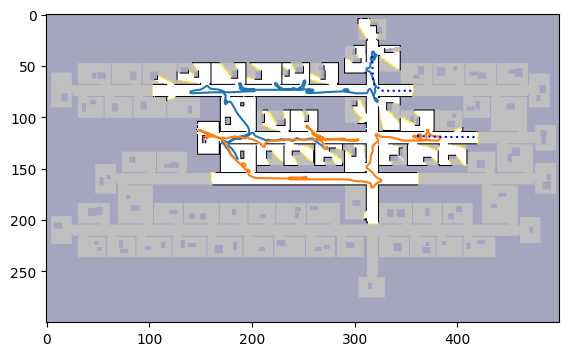

Robot 0 | Subgoal (294, 44) | Dist: 28.73 | Area: 130 | Cost: -621.27
Robot 0 | Subgoal (400, 111) | Dist: 156.31 | Area: 423 | Cost: -1958.69
Robot 0 | Subgoal (403, 129) | Dist: 161.46 | Area: 21 | Cost: 56.46
Robot 0 | Subgoal (108, 65) | Dist: 234.73 | Area: 515 | Cost: -2340.27
Robot 0 | Subgoal (356, 74) | Dist: 65.73 | Area: 107088 | Cost: -535374.27
Robot 0 | Subgoal (359, 97) | Dist: 146.97 | Area: 135 | Cost: -528.03
Robot 0 | Subgoal (303, 41) | Dist: 21.31 | Area: 130 | Cost: -628.69
Robot 0 | Subgoal (262, 59) | Dist: 84.80 | Area: 118 | Cost: -505.20
Robot 0 | Subgoal (340, 36) | Dist: 27.31 | Area: 43 | Cost: -187.69
Robot 0 | Subgoal (240, 51) | Dist: 112.04 | Area: 47 | Cost: -122.96
Robot 0 | Subgoal (279, 143) | Dist: 145.11 | Area: 40 | Cost: -54.89
Robot 0 | Subgoal (251, 97) | Dist: 150.46 | Area: 22 | Cost: 40.46
Robot 0 | Subgoal (377, 141) | Dist: 142.60 | Area: 49 | Cost: -102.40
Robot 0 | Subgoal (315, 7) | Dist: 38.49 | Area: 157 | Cost: -746.51
Robot 0 | Su

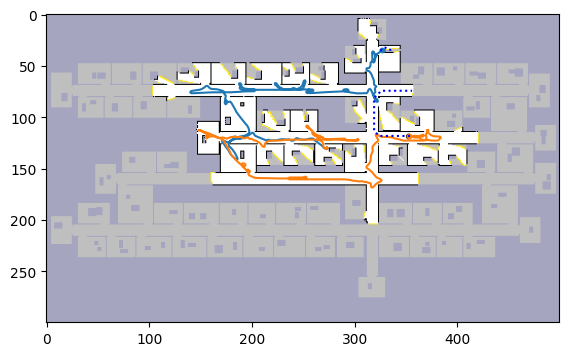

Robot 0 | Subgoal (294, 44) | Dist: 43.46 | Area: 130 | Cost: -606.54
Robot 0 | Subgoal (400, 111) | Dist: 167.73 | Area: 423 | Cost: -1947.27
Robot 0 | Subgoal (403, 129) | Dist: 172.87 | Area: 21 | Cost: 67.87
Robot 0 | Subgoal (108, 65) | Dist: 249.46 | Area: 515 | Cost: -2325.54
Robot 0 | Subgoal (356, 74) | Dist: 77.14 | Area: 107308 | Cost: -536462.86
Robot 0 | Subgoal (359, 97) | Dist: 158.38 | Area: 135 | Cost: -516.62
Robot 0 | Subgoal (303, 41) | Dist: 36.04 | Area: 130 | Cost: -613.96
Robot 0 | Subgoal (262, 59) | Dist: 99.53 | Area: 118 | Cost: -490.47
Robot 0 | Subgoal (240, 51) | Dist: 126.77 | Area: 47 | Cost: -108.23
Robot 0 | Subgoal (279, 143) | Dist: 159.84 | Area: 40 | Cost: -40.16
Robot 0 | Subgoal (251, 97) | Dist: 165.18 | Area: 22 | Cost: 55.18
Robot 0 | Subgoal (377, 141) | Dist: 154.01 | Area: 50 | Cost: -95.99
Robot 0 | Subgoal (315, 7) | Dist: 34.97 | Area: 157 | Cost: -750.03
Robot 0 | Subgoal (141, 57) | Dist: 222.11 | Area: 118 | Cost: -367.89
Robot 0 | S

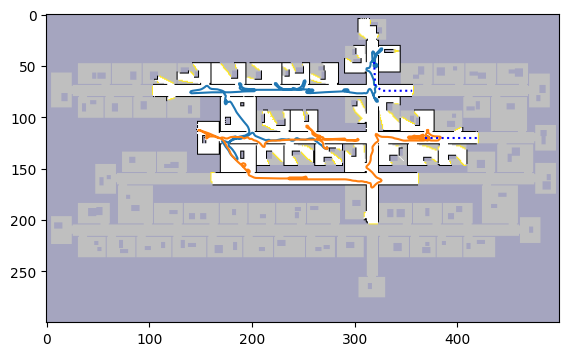

Robot 0 | Subgoal (294, 44) | Dist: 28.66 | Area: 130 | Cost: -621.34
Robot 0 | Subgoal (400, 111) | Dist: 148.49 | Area: 423 | Cost: -1966.51
Robot 0 | Subgoal (403, 129) | Dist: 153.63 | Area: 21 | Cost: 48.63
Robot 0 | Subgoal (108, 65) | Dist: 228.56 | Area: 515 | Cost: -2346.44
Robot 0 | Subgoal (356, 74) | Dist: 57.90 | Area: 107311 | Cost: -536497.10
Robot 0 | Subgoal (359, 97) | Dist: 139.14 | Area: 135 | Cost: -535.86
Robot 0 | Subgoal (303, 41) | Dist: 22.07 | Area: 130 | Cost: -627.93
Robot 0 | Subgoal (262, 59) | Dist: 78.63 | Area: 118 | Cost: -511.37
Robot 0 | Subgoal (240, 51) | Dist: 105.87 | Area: 47 | Cost: -129.13
Robot 0 | Subgoal (279, 143) | Dist: 138.94 | Area: 40 | Cost: -61.06
Robot 0 | Subgoal (251, 97) | Dist: 144.28 | Area: 22 | Cost: 34.28
Robot 0 | Subgoal (315, 7) | Dist: 46.31 | Area: 157 | Cost: -738.69
Robot 0 | Subgoal (141, 57) | Dist: 201.21 | Area: 118 | Cost: -388.79
Robot 0 | Subgoal (299, 128) | Dist: 125.80 | Area: 58 | Cost: -164.20
Robot 0 | 

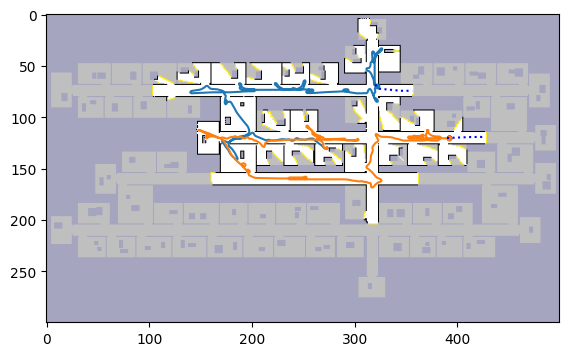

Robot 0 | Subgoal (294, 44) | Dist: 43.46 | Area: 130 | Cost: -606.54
Robot 0 | Subgoal (403, 129) | Dist: 133.21 | Area: 21 | Cost: 28.21
Robot 0 | Subgoal (108, 65) | Dist: 215.66 | Area: 515 | Cost: -2359.34
Robot 0 | Subgoal (351, 103) | Dist: 117.97 | Area: 133 | Cost: -547.03
Robot 0 | Subgoal (359, 97) | Dist: 118.73 | Area: 133 | Cost: -546.27
Robot 0 | Subgoal (402, 142) | Dist: 139.94 | Area: 72 | Cost: -220.06
Robot 0 | Subgoal (303, 41) | Dist: 39.21 | Area: 130 | Cost: -610.79
Robot 0 | Subgoal (262, 59) | Dist: 65.73 | Area: 118 | Cost: -524.27
Robot 0 | Subgoal (240, 51) | Dist: 92.97 | Area: 47 | Cost: -142.03
Robot 0 | Subgoal (279, 143) | Dist: 120.18 | Area: 40 | Cost: -79.82
Robot 0 | Subgoal (251, 97) | Dist: 125.53 | Area: 22 | Cost: 15.53
Robot 0 | Subgoal (315, 7) | Dist: 67.56 | Area: 157 | Cost: -717.44
Robot 0 | Subgoal (141, 57) | Dist: 188.31 | Area: 118 | Cost: -401.69
Robot 0 | Subgoal (299, 128) | Dist: 107.04 | Area: 58 | Cost: -182.96
Robot 0 | Subgoal

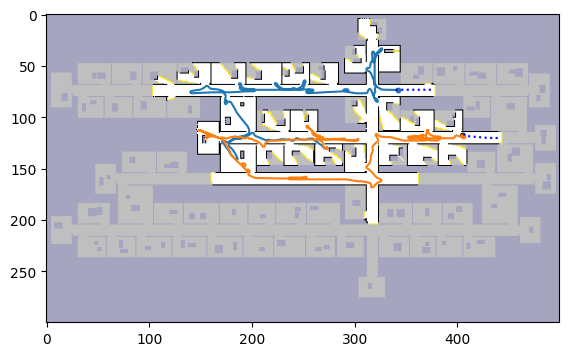

Robot 0 | Subgoal (294, 44) | Dist: 65.70 | Area: 130 | Cost: -584.30
Robot 0 | Subgoal (403, 129) | Dist: 148.28 | Area: 21 | Cost: 43.28
Robot 0 | Subgoal (108, 65) | Dist: 237.90 | Area: 515 | Cost: -2337.10
Robot 0 | Subgoal (351, 103) | Dist: 133.04 | Area: 133 | Cost: -531.96
Robot 0 | Subgoal (359, 97) | Dist: 133.80 | Area: 133 | Cost: -531.20
Robot 0 | Subgoal (402, 142) | Dist: 155.01 | Area: 72 | Cost: -204.99
Robot 0 | Subgoal (303, 41) | Dist: 61.46 | Area: 130 | Cost: -588.54
Robot 0 | Subgoal (442, 120) | Dist: 184.56 | Area: 108086 | Cost: -540245.44
Robot 0 | Subgoal (262, 59) | Dist: 87.97 | Area: 118 | Cost: -502.03
Robot 0 | Subgoal (240, 51) | Dist: 115.21 | Area: 47 | Cost: -119.79
Robot 0 | Subgoal (279, 143) | Dist: 135.25 | Area: 40 | Cost: -64.75
Robot 0 | Subgoal (251, 97) | Dist: 140.60 | Area: 22 | Cost: 30.60
Robot 0 | Subgoal (315, 7) | Dist: 89.80 | Area: 157 | Cost: -695.20
Robot 0 | Subgoal (141, 57) | Dist: 210.56 | Area: 118 | Cost: -379.44
Robot 0 |

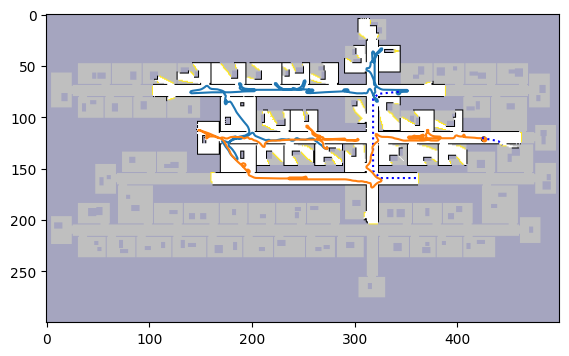

Robot 0 | Subgoal (370, 66) | Dist: 35.31 | Area: 505 | Cost: -2489.69
Robot 0 | Subgoal (108, 65) | Dist: 235.73 | Area: 515 | Cost: -2339.27
Robot 0 | Subgoal (262, 59) | Dist: 85.80 | Area: 118 | Cost: -504.20
Robot 0 | Subgoal (240, 51) | Dist: 113.04 | Area: 47 | Cost: -121.96
Robot 0 | Subgoal (279, 143) | Dist: 131.43 | Area: 40 | Cost: -68.57
Robot 0 | Subgoal (251, 97) | Dist: 136.77 | Area: 22 | Cost: 26.77
Robot 0 | Subgoal (315, 7) | Dist: 87.63 | Area: 157 | Cost: -697.37
Robot 0 | Subgoal (299, 128) | Dist: 118.28 | Area: 58 | Cost: -171.72
Robot 0 | Subgoal (262, 65) | Dist: 82.14 | Area: 19 | Cost: -12.86
Robot 0 | Subgoal (116, 63) | Dist: 227.97 | Area: 515 | Cost: -2347.03
Robot 0 | Subgoal (184, 50) | Dist: 173.56 | Area: 115 | Cost: -401.44
Robot 0 | Subgoal (160, 158) | Dist: 254.21 | Area: 27344 | Cost: -136465.79
Robot 0 | Subgoal (198, 61) | Dist: 147.38 | Area: 117 | Cost: -437.62
Robot 0 | Subgoal (368, 144) | Dist: 120.77 | Area: 49 | Cost: -124.23
Robot 0 |

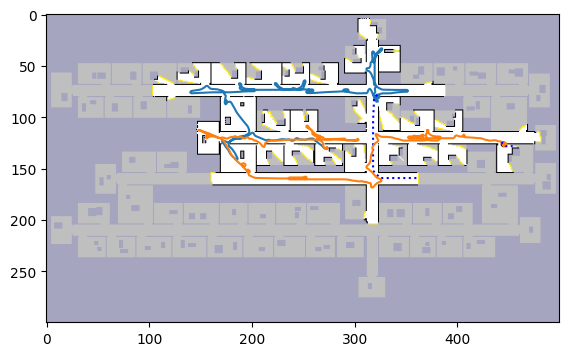

Robot 0 | Subgoal (370, 66) | Dist: 57.38 | Area: 505 | Cost: -2467.62
Robot 0 | Subgoal (108, 65) | Dist: 217.80 | Area: 515 | Cost: -2357.20
Robot 0 | Subgoal (262, 59) | Dist: 67.87 | Area: 118 | Cost: -522.13
Robot 0 | Subgoal (240, 51) | Dist: 95.11 | Area: 47 | Cost: -139.89
Robot 0 | Subgoal (279, 143) | Dist: 109.36 | Area: 40 | Cost: -90.64
Robot 0 | Subgoal (251, 97) | Dist: 114.70 | Area: 22 | Cost: 4.70
Robot 0 | Subgoal (315, 7) | Dist: 76.73 | Area: 157 | Cost: -708.27
Robot 0 | Subgoal (299, 128) | Dist: 96.21 | Area: 58 | Cost: -193.79
Robot 0 | Subgoal (262, 65) | Dist: 64.21 | Area: 19 | Cost: -30.79
Robot 0 | Subgoal (116, 63) | Dist: 210.04 | Area: 515 | Cost: -2364.96
Robot 0 | Subgoal (184, 50) | Dist: 155.63 | Area: 115 | Cost: -419.37
Robot 0 | Subgoal (160, 158) | Dist: 232.14 | Area: 27005 | Cost: -134792.86
Robot 0 | Subgoal (198, 61) | Dist: 129.46 | Area: 117 | Cost: -455.54
Robot 0 | Subgoal (368, 144) | Dist: 99.53 | Area: 49 | Cost: -145.47
Robot 0 | Sub

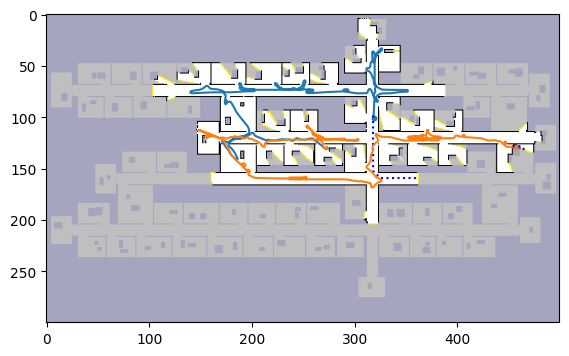

Robot 0 | Subgoal (370, 66) | Dist: 80.21 | Area: 505 | Cost: -2444.79
Robot 0 | Subgoal (108, 65) | Dist: 235.46 | Area: 515 | Cost: -2339.54
Robot 0 | Subgoal (262, 59) | Dist: 85.53 | Area: 118 | Cost: -504.47
Robot 0 | Subgoal (240, 51) | Dist: 112.77 | Area: 47 | Cost: -122.23
Robot 0 | Subgoal (279, 143) | Dist: 86.53 | Area: 40 | Cost: -113.47
Robot 0 | Subgoal (251, 97) | Dist: 91.87 | Area: 22 | Cost: -18.13
Robot 0 | Subgoal (315, 7) | Dist: 97.90 | Area: 157 | Cost: -687.10
Robot 0 | Subgoal (299, 128) | Dist: 73.38 | Area: 58 | Cost: -216.62
Robot 0 | Subgoal (262, 65) | Dist: 81.87 | Area: 19 | Cost: -13.13
Robot 0 | Subgoal (116, 63) | Dist: 227.70 | Area: 515 | Cost: -2347.30
Robot 0 | Subgoal (184, 50) | Dist: 173.28 | Area: 115 | Cost: -401.72
Robot 0 | Subgoal (160, 158) | Dist: 209.31 | Area: 26915 | Cost: -134365.69
Robot 0 | Subgoal (198, 61) | Dist: 147.11 | Area: 117 | Cost: -437.89
Robot 0 | Subgoal (368, 144) | Dist: 78.36 | Area: 49 | Cost: -166.64
Robot 0 | S

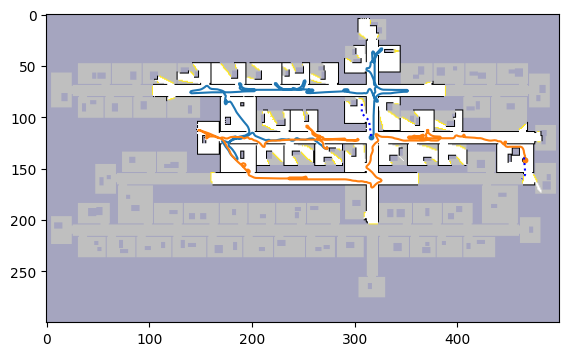

Robot 0 | Subgoal (370, 66) | Dist: 97.87 | Area: 505 | Cost: -2427.13
Robot 0 | Subgoal (108, 65) | Dist: 231.64 | Area: 515 | Cost: -2343.36
Robot 0 | Subgoal (293, 85) | Dist: 43.21 | Area: 35 | Cost: -131.79
Robot 0 | Subgoal (262, 59) | Dist: 99.87 | Area: 118 | Cost: -490.13
Robot 0 | Subgoal (240, 51) | Dist: 127.11 | Area: 47 | Cost: -107.89
Robot 0 | Subgoal (279, 143) | Dist: 71.21 | Area: 40 | Cost: -128.79
Robot 0 | Subgoal (251, 97) | Dist: 78.21 | Area: 22 | Cost: -31.79
Robot 0 | Subgoal (315, 7) | Dist: 112.24 | Area: 157 | Cost: -672.76
Robot 0 | Subgoal (299, 128) | Dist: 55.73 | Area: 58 | Cost: -234.27
Robot 0 | Subgoal (262, 65) | Dist: 96.21 | Area: 19 | Cost: 1.21
Robot 0 | Subgoal (116, 63) | Dist: 223.88 | Area: 515 | Cost: -2351.12
Robot 0 | Subgoal (184, 50) | Dist: 187.63 | Area: 115 | Cost: -387.37
Robot 0 | Subgoal (160, 158) | Dist: 191.66 | Area: 25864 | Cost: -129128.34
Robot 0 | Subgoal (198, 61) | Dist: 161.46 | Area: 117 | Cost: -423.54
Robot 0 | Sub

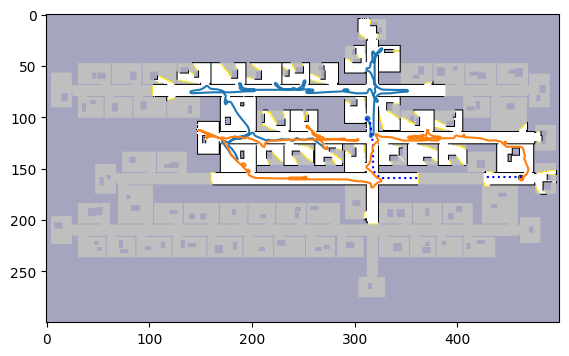

Robot 0 | Subgoal (370, 66) | Dist: 80.28 | Area: 505 | Cost: -2444.72
Robot 0 | Subgoal (108, 65) | Dist: 231.38 | Area: 515 | Cost: -2343.62
Robot 0 | Subgoal (293, 85) | Dist: 27.14 | Area: 33 | Cost: -137.86
Robot 0 | Subgoal (262, 59) | Dist: 81.46 | Area: 118 | Cost: -508.54
Robot 0 | Subgoal (240, 51) | Dist: 108.70 | Area: 47 | Cost: -126.30
Robot 0 | Subgoal (279, 143) | Dist: 86.46 | Area: 40 | Cost: -113.54
Robot 0 | Subgoal (251, 97) | Dist: 91.80 | Area: 22 | Cost: -18.20
Robot 0 | Subgoal (309, 83) | Dist: 19.24 | Area: 3 | Cost: 4.24
Robot 0 | Subgoal (315, 7) | Dist: 94.66 | Area: 157 | Cost: -690.34
Robot 0 | Subgoal (299, 128) | Dist: 73.31 | Area: 58 | Cost: -216.69
Robot 0 | Subgoal (424, 163) | Dist: 233.98 | Area: 684 | Cost: -3186.02
Robot 0 | Subgoal (262, 65) | Dist: 77.80 | Area: 19 | Cost: -17.20
Robot 0 | Subgoal (116, 63) | Dist: 223.63 | Area: 515 | Cost: -2351.37
Robot 0 | Subgoal (184, 50) | Dist: 169.21 | Area: 115 | Cost: -405.79
Robot 0 | Subgoal (160

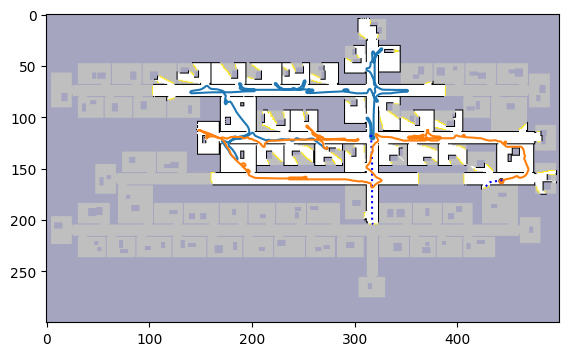

Robot 0 | Subgoal (370, 66) | Dist: 100.04 | Area: 505 | Cost: -2424.96
Robot 0 | Subgoal (108, 65) | Dist: 234.88 | Area: 515 | Cost: -2340.12
Robot 0 | Subgoal (404, 160) | Dist: 236.94 | Area: 472 | Cost: -2123.06
Robot 0 | Subgoal (293, 85) | Dist: 47.04 | Area: 33 | Cost: -117.96
Robot 0 | Subgoal (262, 59) | Dist: 103.70 | Area: 118 | Cost: -486.30
Robot 0 | Subgoal (240, 51) | Dist: 130.94 | Area: 47 | Cost: -104.06
Robot 0 | Subgoal (279, 143) | Dist: 71.97 | Area: 40 | Cost: -128.03
Robot 0 | Subgoal (251, 97) | Dist: 81.46 | Area: 22 | Cost: -28.54
Robot 0 | Subgoal (309, 83) | Dist: 40.90 | Area: 3 | Cost: 25.90
Robot 0 | Subgoal (315, 7) | Dist: 116.07 | Area: 157 | Cost: -668.93
Robot 0 | Subgoal (299, 128) | Dist: 53.56 | Area: 58 | Cost: -236.44
Robot 0 | Subgoal (262, 65) | Dist: 100.04 | Area: 19 | Cost: 5.04
Robot 0 | Subgoal (116, 63) | Dist: 227.12 | Area: 515 | Cost: -2347.88
Robot 0 | Subgoal (184, 50) | Dist: 191.46 | Area: 115 | Cost: -383.54
Robot 0 | Subgoal (

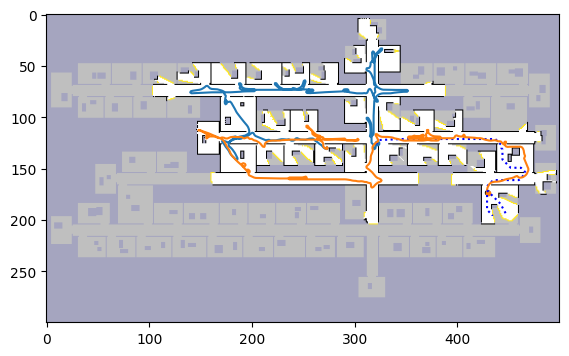

Robot 0 | Subgoal (370, 66) | Dist: 100.38 | Area: 505 | Cost: -2424.62
Robot 0 | Subgoal (108, 65) | Dist: 241.71 | Area: 515 | Cost: -2333.29
Robot 0 | Subgoal (293, 85) | Dist: 51.53 | Area: 33 | Cost: -113.47
Robot 0 | Subgoal (262, 59) | Dist: 108.18 | Area: 118 | Cost: -481.82
Robot 0 | Subgoal (240, 51) | Dist: 135.43 | Area: 47 | Cost: -99.57
Robot 0 | Subgoal (279, 143) | Dist: 77.14 | Area: 40 | Cost: -122.86
Robot 0 | Subgoal (251, 97) | Dist: 88.28 | Area: 22 | Cost: -21.72
Robot 0 | Subgoal (309, 83) | Dist: 45.38 | Area: 3 | Cost: 30.38
Robot 0 | Subgoal (315, 7) | Dist: 120.56 | Area: 157 | Cost: -664.44
Robot 0 | Subgoal (299, 128) | Dist: 54.04 | Area: 58 | Cost: -235.96
Robot 0 | Subgoal (262, 65) | Dist: 104.53 | Area: 19 | Cost: 9.53
Robot 0 | Subgoal (116, 63) | Dist: 233.95 | Area: 515 | Cost: -2341.05
Robot 0 | Subgoal (184, 50) | Dist: 195.94 | Area: 115 | Cost: -379.06
Robot 0 | Subgoal (160, 158) | Dist: 189.97 | Area: 23216 | Cost: -115890.03
Robot 0 | Subgoa

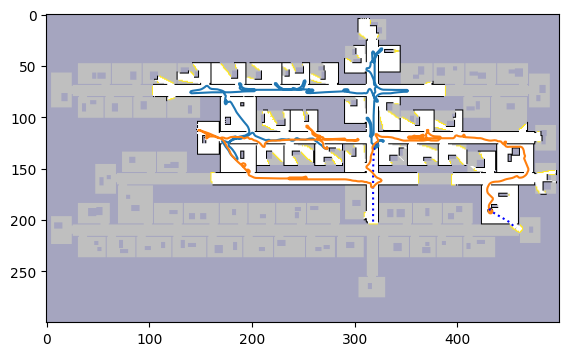

Robot 0 | Subgoal (370, 66) | Dist: 105.80 | Area: 505 | Cost: -2419.20
Robot 0 | Subgoal (108, 65) | Dist: 240.78 | Area: 515 | Cost: -2334.22
Robot 0 | Subgoal (293, 85) | Dist: 55.28 | Area: 33 | Cost: -109.72
Robot 0 | Subgoal (262, 59) | Dist: 111.94 | Area: 118 | Cost: -478.06
Robot 0 | Subgoal (240, 51) | Dist: 139.18 | Area: 47 | Cost: -95.82
Robot 0 | Subgoal (279, 143) | Dist: 75.38 | Area: 40 | Cost: -124.62
Robot 0 | Subgoal (251, 97) | Dist: 87.36 | Area: 22 | Cost: -22.64
Robot 0 | Subgoal (309, 83) | Dist: 49.14 | Area: 3 | Cost: 34.14
Robot 0 | Subgoal (315, 7) | Dist: 124.31 | Area: 157 | Cost: -660.69
Robot 0 | Subgoal (299, 128) | Dist: 47.80 | Area: 58 | Cost: -242.20
Robot 0 | Subgoal (262, 65) | Dist: 108.28 | Area: 19 | Cost: 13.28
Robot 0 | Subgoal (459, 209) | Dist: 267.61 | Area: 112534 | Cost: -562402.39
Robot 0 | Subgoal (116, 63) | Dist: 233.02 | Area: 515 | Cost: -2341.98
Robot 0 | Subgoal (184, 50) | Dist: 199.70 | Area: 115 | Cost: -375.30
Robot 0 | Subg

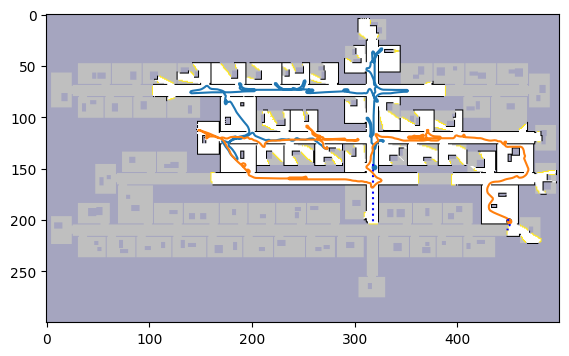

Robot 0 | Subgoal (370, 66) | Dist: 127.21 | Area: 505 | Cost: -2397.79
Robot 0 | Subgoal (108, 65) | Dist: 259.61 | Area: 515 | Cost: -2315.39
Robot 0 | Subgoal (293, 85) | Dist: 75.87 | Area: 33 | Cost: -89.13
Robot 0 | Subgoal (262, 59) | Dist: 132.53 | Area: 118 | Cost: -457.47
Robot 0 | Subgoal (240, 51) | Dist: 159.77 | Area: 47 | Cost: -75.23
Robot 0 | Subgoal (279, 143) | Dist: 94.21 | Area: 40 | Cost: -105.79
Robot 0 | Subgoal (251, 97) | Dist: 106.18 | Area: 22 | Cost: -3.82
Robot 0 | Subgoal (309, 83) | Dist: 69.73 | Area: 3 | Cost: 54.73
Robot 0 | Subgoal (465, 206) | Dist: 291.61 | Area: 258 | Cost: -998.39
Robot 0 | Subgoal (315, 7) | Dist: 144.90 | Area: 157 | Cost: -640.10
Robot 0 | Subgoal (299, 128) | Dist: 34.14 | Area: 58 | Cost: -255.86
Robot 0 | Subgoal (463, 219) | Dist: 299.10 | Area: 27 | Cost: 164.10
Robot 0 | Subgoal (262, 65) | Dist: 128.87 | Area: 19 | Cost: 33.87
Robot 0 | Subgoal (445, 210) | Dist: 288.37 | Area: 22381 | Cost: -111616.63
Robot 0 | Subgoal

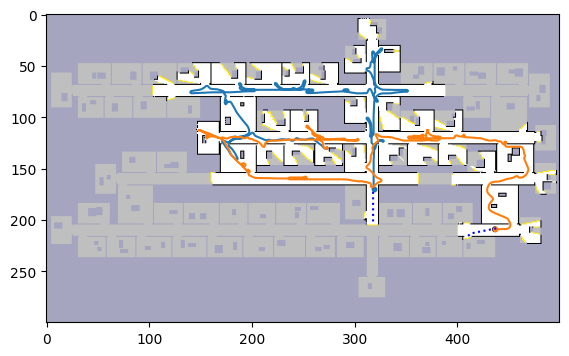

Robot 0 | Subgoal (370, 66) | Dist: 149.21 | Area: 505 | Cost: -2375.79
Robot 0 | Subgoal (108, 65) | Dist: 281.61 | Area: 515 | Cost: -2293.39
Robot 0 | Subgoal (409, 217) | Dist: 348.68 | Area: 113532 | Cost: -567311.32
Robot 0 | Subgoal (293, 85) | Dist: 97.87 | Area: 33 | Cost: -67.13
Robot 0 | Subgoal (262, 59) | Dist: 154.53 | Area: 118 | Cost: -435.47
Robot 0 | Subgoal (240, 51) | Dist: 181.77 | Area: 47 | Cost: -53.23
Robot 0 | Subgoal (279, 143) | Dist: 116.21 | Area: 40 | Cost: -83.79
Robot 0 | Subgoal (309, 83) | Dist: 91.73 | Area: 3 | Cost: 76.73
Robot 0 | Subgoal (251, 97) | Dist: 128.18 | Area: 22 | Cost: 18.18
Robot 0 | Subgoal (315, 7) | Dist: 166.90 | Area: 157 | Cost: -618.10
Robot 0 | Subgoal (299, 128) | Dist: 52.63 | Area: 58 | Cost: -237.37
Robot 0 | Subgoal (463, 219) | Dist: 321.10 | Area: 27 | Cost: 186.10
Robot 0 | Subgoal (475, 212) | Dist: 327.92 | Area: 46 | Cost: 97.92
Robot 0 | Subgoal (262, 65) | Dist: 150.87 | Area: 19 | Cost: 55.87
Robot 0 | Subgoal (

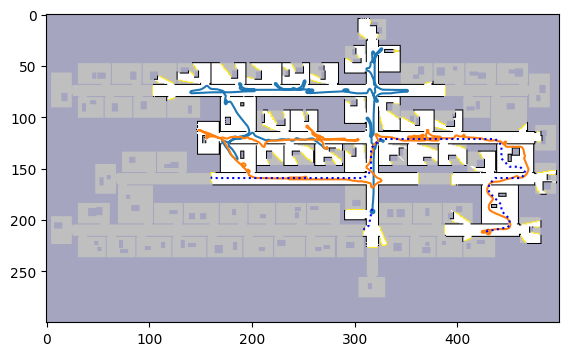

Robot 0 | Subgoal (395, 201) | Dist: 380.61 | Area: 398 | Cost: -1609.39
Robot 0 | Subgoal (370, 66) | Dist: 171.04 | Area: 505 | Cost: -2353.96
Robot 0 | Subgoal (108, 65) | Dist: 301.78 | Area: 515 | Cost: -2273.22
Robot 0 | Subgoal (293, 85) | Dist: 118.04 | Area: 33 | Cost: -46.96
Robot 0 | Subgoal (262, 59) | Dist: 174.70 | Area: 118 | Cost: -415.30
Robot 0 | Subgoal (293, 184) | Dist: 25.90 | Area: 319 | Cost: -1569.10
Robot 0 | Subgoal (240, 51) | Dist: 201.94 | Area: 47 | Cost: -33.06
Robot 0 | Subgoal (309, 83) | Dist: 111.90 | Area: 3 | Cost: 96.90
Robot 0 | Subgoal (279, 143) | Dist: 136.38 | Area: 40 | Cost: -63.62
Robot 0 | Subgoal (251, 97) | Dist: 148.36 | Area: 22 | Cost: 38.36
Robot 0 | Subgoal (315, 7) | Dist: 187.07 | Area: 157 | Cost: -597.93
Robot 0 | Subgoal (299, 128) | Dist: 72.80 | Area: 58 | Cost: -217.20
Robot 0 | Subgoal (463, 219) | Dist: 342.92 | Area: 27 | Cost: 207.92
Robot 0 | Subgoal (475, 212) | Dist: 349.75 | Area: 46 | Cost: 119.75
Robot 0 | Subgoal

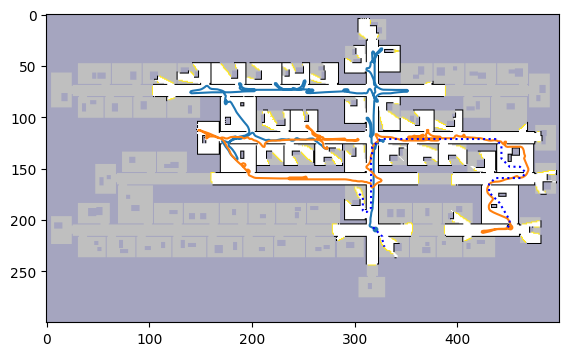

Robot 0 | Subgoal (395, 201) | Dist: 395.54 | Area: 398 | Cost: -1594.46
Robot 0 | Subgoal (370, 66) | Dist: 185.97 | Area: 505 | Cost: -2339.03
Robot 0 | Subgoal (108, 65) | Dist: 320.85 | Area: 515 | Cost: -2254.15
Robot 0 | Subgoal (293, 85) | Dist: 137.11 | Area: 33 | Cost: -27.89
Robot 0 | Subgoal (262, 59) | Dist: 193.77 | Area: 118 | Cost: -396.23
Robot 0 | Subgoal (240, 51) | Dist: 221.01 | Area: 47 | Cost: -13.99
Robot 0 | Subgoal (279, 143) | Dist: 155.46 | Area: 40 | Cost: -44.54
Robot 0 | Subgoal (309, 83) | Dist: 130.97 | Area: 3 | Cost: 115.97
Robot 0 | Subgoal (251, 97) | Dist: 167.43 | Area: 22 | Cost: 57.43
Robot 0 | Subgoal (315, 7) | Dist: 206.14 | Area: 157 | Cost: -578.86
Robot 0 | Subgoal (299, 128) | Dist: 91.87 | Area: 58 | Cost: -198.13
Robot 0 | Subgoal (463, 219) | Dist: 357.85 | Area: 27 | Cost: 222.85
Robot 0 | Subgoal (475, 212) | Dist: 364.68 | Area: 46 | Cost: 134.68
Robot 0 | Subgoal (262, 65) | Dist: 190.11 | Area: 19 | Cost: 95.11
Robot 0 | Subgoal (2

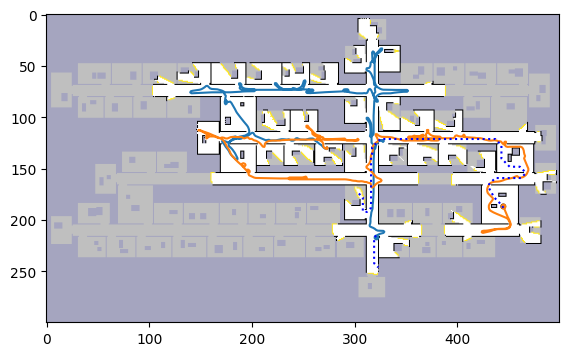

Robot 0 | Subgoal (395, 201) | Dist: 403.95 | Area: 398 | Cost: -1586.05
Robot 0 | Subgoal (370, 66) | Dist: 194.38 | Area: 505 | Cost: -2330.62
Robot 0 | Subgoal (108, 65) | Dist: 328.44 | Area: 515 | Cost: -2246.56
Robot 0 | Subgoal (293, 85) | Dist: 144.70 | Area: 33 | Cost: -20.30
Robot 0 | Subgoal (262, 59) | Dist: 201.36 | Area: 118 | Cost: -388.64
Robot 0 | Subgoal (346, 218) | Dist: 30.49 | Area: 16 | Cost: -49.51
Robot 0 | Subgoal (240, 51) | Dist: 228.60 | Area: 47 | Cost: -6.40
Robot 0 | Subgoal (279, 143) | Dist: 163.04 | Area: 40 | Cost: -36.96
Robot 0 | Subgoal (309, 83) | Dist: 138.56 | Area: 3 | Cost: 123.56
Robot 0 | Subgoal (251, 97) | Dist: 175.01 | Area: 22 | Cost: 65.01
Robot 0 | Subgoal (315, 7) | Dist: 213.73 | Area: 157 | Cost: -571.27
Robot 0 | Subgoal (299, 128) | Dist: 99.46 | Area: 58 | Cost: -190.54
Robot 0 | Subgoal (475, 212) | Dist: 373.10 | Area: 46 | Cost: 143.10
Robot 0 | Subgoal (262, 65) | Dist: 197.70 | Area: 19 | Cost: 102.70
Robot 0 | Subgoal (46

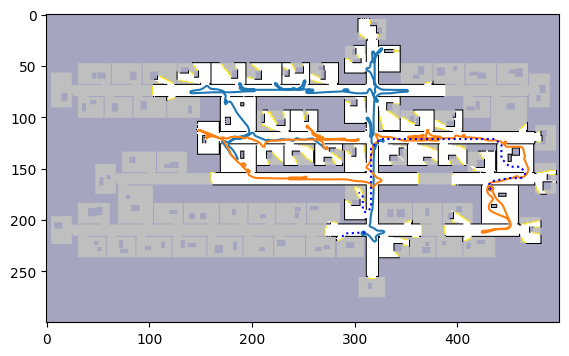

Robot 0 | Subgoal (395, 201) | Dist: 404.75 | Area: 398 | Cost: -1585.25
Robot 0 | Subgoal (370, 66) | Dist: 195.18 | Area: 505 | Cost: -2329.82
Robot 0 | Subgoal (108, 65) | Dist: 323.44 | Area: 515 | Cost: -2251.56
Robot 0 | Subgoal (293, 85) | Dist: 139.70 | Area: 33 | Cost: -25.30
Robot 0 | Subgoal (262, 59) | Dist: 196.36 | Area: 118 | Cost: -393.64
Robot 0 | Subgoal (240, 51) | Dist: 223.60 | Area: 47 | Cost: -11.40
Robot 0 | Subgoal (279, 143) | Dist: 158.04 | Area: 40 | Cost: -41.96
Robot 0 | Subgoal (309, 83) | Dist: 133.56 | Area: 3 | Cost: 118.56
Robot 0 | Subgoal (251, 97) | Dist: 170.01 | Area: 22 | Cost: 60.01
Robot 0 | Subgoal (270, 210) | Dist: 36.83 | Area: 14830 | Cost: -74113.17
Robot 0 | Subgoal (315, 7) | Dist: 209.56 | Area: 157 | Cost: -575.44
Robot 0 | Subgoal (299, 128) | Dist: 94.46 | Area: 58 | Cost: -195.54
Robot 0 | Subgoal (475, 212) | Dist: 373.89 | Area: 46 | Cost: 143.89
Robot 0 | Subgoal (262, 65) | Dist: 192.70 | Area: 19 | Cost: 97.70
Robot 0 | Subgo

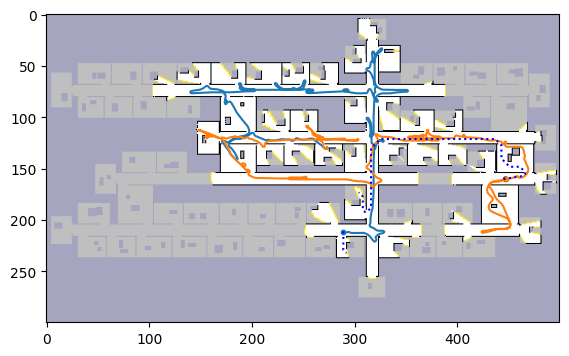

Robot 0 | Subgoal (395, 201) | Dist: 423.17 | Area: 398 | Cost: -1566.83
Robot 0 | Subgoal (370, 66) | Dist: 213.60 | Area: 505 | Cost: -2311.40
Robot 0 | Subgoal (108, 65) | Dist: 341.85 | Area: 515 | Cost: -2233.15
Robot 0 | Subgoal (394, 160) | Dist: 352.74 | Area: 363 | Cost: -1462.26
Robot 0 | Subgoal (293, 85) | Dist: 158.11 | Area: 33 | Cost: -6.89
Robot 0 | Subgoal (262, 59) | Dist: 214.77 | Area: 118 | Cost: -375.23
Robot 0 | Subgoal (240, 51) | Dist: 242.01 | Area: 47 | Cost: 7.01
Robot 0 | Subgoal (279, 143) | Dist: 176.46 | Area: 40 | Cost: -23.54
Robot 0 | Subgoal (309, 83) | Dist: 151.97 | Area: 3 | Cost: 136.97
Robot 0 | Subgoal (251, 97) | Dist: 188.43 | Area: 22 | Cost: 78.43
Robot 0 | Subgoal (315, 7) | Dist: 227.97 | Area: 157 | Cost: -557.03
Robot 0 | Subgoal (299, 128) | Dist: 112.87 | Area: 58 | Cost: -177.13
Robot 0 | Subgoal (475, 212) | Dist: 392.31 | Area: 46 | Cost: 162.31
Robot 0 | Subgoal (262, 65) | Dist: 211.11 | Area: 19 | Cost: 116.11
Robot 0 | Subgoal 

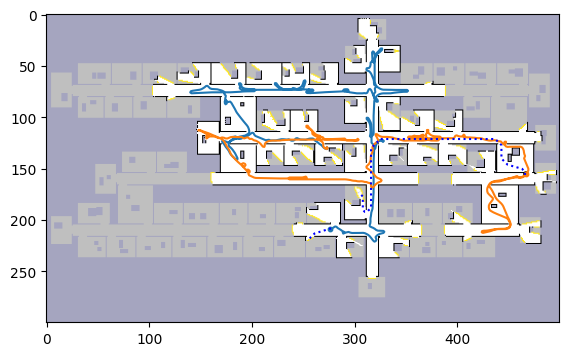

Robot 0 | Subgoal (395, 201) | Dist: 435.51 | Area: 398 | Cost: -1554.49
Robot 0 | Subgoal (370, 66) | Dist: 225.94 | Area: 505 | Cost: -2299.06
Robot 0 | Subgoal (108, 65) | Dist: 354.20 | Area: 515 | Cost: -2220.80
Robot 0 | Subgoal (394, 160) | Dist: 365.08 | Area: 363 | Cost: -1449.92
Robot 0 | Subgoal (293, 85) | Dist: 170.46 | Area: 33 | Cost: 5.46
Robot 0 | Subgoal (262, 59) | Dist: 227.11 | Area: 118 | Cost: -362.89
Robot 0 | Subgoal (240, 51) | Dist: 254.36 | Area: 47 | Cost: 19.36
Robot 0 | Subgoal (279, 143) | Dist: 188.80 | Area: 40 | Cost: -11.20
Robot 0 | Subgoal (309, 83) | Dist: 164.31 | Area: 3 | Cost: 149.31
Robot 0 | Subgoal (251, 97) | Dist: 200.77 | Area: 22 | Cost: 90.77
Robot 0 | Subgoal (238, 210) | Dist: 36.41 | Area: 13413 | Cost: -67028.59
Robot 0 | Subgoal (315, 7) | Dist: 240.31 | Area: 157 | Cost: -544.69
Robot 0 | Subgoal (299, 128) | Dist: 125.21 | Area: 58 | Cost: -164.79
Robot 0 | Subgoal (475, 212) | Dist: 404.65 | Area: 46 | Cost: 174.65
Robot 0 | Su

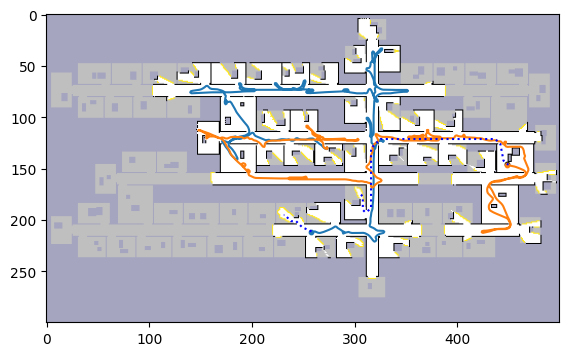

Robot 0 | Subgoal (304, 222) | Dist: 55.56 | Area: 117992 | Cost: -589904.44
Robot 0 | Subgoal (395, 201) | Dist: 454.92 | Area: 398 | Cost: -1535.08
Robot 0 | Subgoal (370, 66) | Dist: 245.36 | Area: 505 | Cost: -2279.64
Robot 0 | Subgoal (108, 65) | Dist: 373.61 | Area: 515 | Cost: -2201.39
Robot 0 | Subgoal (394, 160) | Dist: 384.50 | Area: 363 | Cost: -1430.50
Robot 0 | Subgoal (293, 85) | Dist: 189.87 | Area: 33 | Cost: 24.87
Robot 0 | Subgoal (262, 59) | Dist: 246.53 | Area: 118 | Cost: -343.47
Robot 0 | Subgoal (266, 220) | Dist: 17.90 | Area: 233 | Cost: -1147.10
Robot 0 | Subgoal (240, 51) | Dist: 273.77 | Area: 47 | Cost: 38.77
Robot 0 | Subgoal (279, 143) | Dist: 208.21 | Area: 40 | Cost: 8.21
Robot 0 | Subgoal (309, 83) | Dist: 183.73 | Area: 3 | Cost: 168.73
Robot 0 | Subgoal (251, 97) | Dist: 220.18 | Area: 22 | Cost: 110.18
Robot 0 | Subgoal (315, 7) | Dist: 259.73 | Area: 157 | Cost: -525.27
Robot 0 | Subgoal (299, 128) | Dist: 144.63 | Area: 58 | Cost: -145.37
Robot 0 

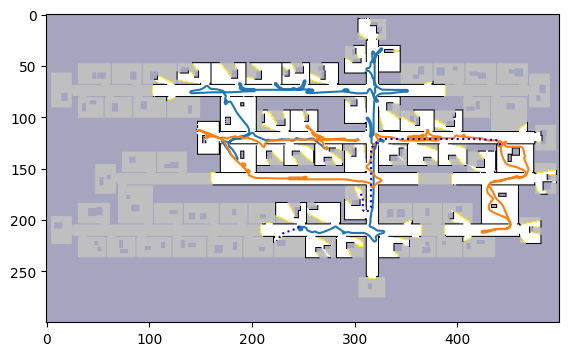

Robot 0 | Subgoal (304, 222) | Dist: 66.38 | Area: 118418 | Cost: -592023.62
Robot 0 | Subgoal (395, 201) | Dist: 464.10 | Area: 398 | Cost: -1525.90
Robot 0 | Subgoal (370, 66) | Dist: 254.53 | Area: 505 | Cost: -2270.47
Robot 0 | Subgoal (108, 65) | Dist: 382.78 | Area: 515 | Cost: -2192.22
Robot 0 | Subgoal (394, 160) | Dist: 393.67 | Area: 363 | Cost: -1421.33
Robot 0 | Subgoal (293, 85) | Dist: 199.04 | Area: 33 | Cost: 34.04
Robot 0 | Subgoal (262, 59) | Dist: 255.70 | Area: 118 | Cost: -334.30
Robot 0 | Subgoal (240, 51) | Dist: 282.94 | Area: 47 | Cost: 47.94
Robot 0 | Subgoal (279, 143) | Dist: 217.38 | Area: 40 | Cost: 17.38
Robot 0 | Subgoal (309, 83) | Dist: 192.90 | Area: 3 | Cost: 177.90
Robot 0 | Subgoal (251, 97) | Dist: 229.36 | Area: 22 | Cost: 119.36
Robot 0 | Subgoal (315, 7) | Dist: 268.90 | Area: 157 | Cost: -516.10
Robot 0 | Subgoal (299, 128) | Dist: 153.80 | Area: 58 | Cost: -136.20
Robot 0 | Subgoal (475, 212) | Dist: 433.24 | Area: 46 | Cost: 203.24
Robot 0 |

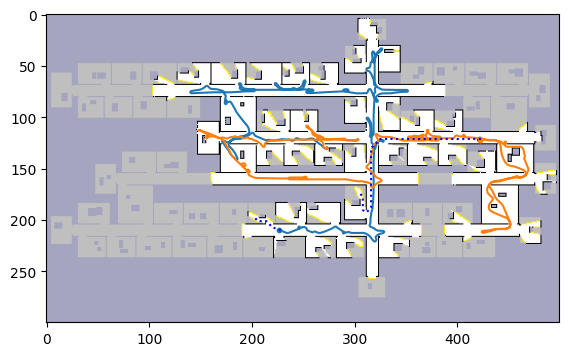

Robot 0 | Subgoal (304, 222) | Dist: 86.38 | Area: 118875 | Cost: -594288.62
Robot 0 | Subgoal (395, 201) | Dist: 484.10 | Area: 398 | Cost: -1505.90
Robot 0 | Subgoal (370, 66) | Dist: 274.53 | Area: 505 | Cost: -2250.47
Robot 0 | Subgoal (108, 65) | Dist: 402.78 | Area: 515 | Cost: -2172.22
Robot 0 | Subgoal (394, 160) | Dist: 413.67 | Area: 363 | Cost: -1401.33
Robot 0 | Subgoal (293, 85) | Dist: 219.04 | Area: 33 | Cost: 54.04
Robot 0 | Subgoal (262, 59) | Dist: 275.70 | Area: 118 | Cost: -314.30
Robot 0 | Subgoal (240, 51) | Dist: 302.94 | Area: 47 | Cost: 67.94
Robot 0 | Subgoal (279, 143) | Dist: 237.38 | Area: 40 | Cost: 37.38
Robot 0 | Subgoal (309, 83) | Dist: 212.90 | Area: 3 | Cost: 197.90
Robot 0 | Subgoal (251, 97) | Dist: 249.36 | Area: 22 | Cost: 139.36
Robot 0 | Subgoal (315, 7) | Dist: 288.90 | Area: 157 | Cost: -496.10
Robot 0 | Subgoal (299, 128) | Dist: 173.80 | Area: 58 | Cost: -116.20
Robot 0 | Subgoal (475, 212) | Dist: 453.24 | Area: 46 | Cost: 223.24
Robot 0 |

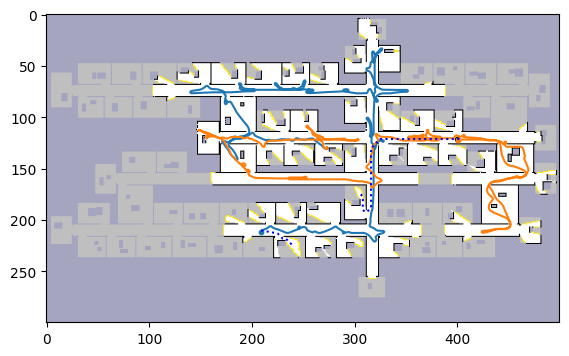

Robot 0 | Subgoal (304, 222) | Dist: 101.73 | Area: 119507 | Cost: -597433.27
Robot 0 | Subgoal (395, 201) | Dist: 502.75 | Area: 398 | Cost: -1487.25
Robot 0 | Subgoal (370, 66) | Dist: 293.18 | Area: 505 | Cost: -2231.82
Robot 0 | Subgoal (108, 65) | Dist: 421.44 | Area: 515 | Cost: -2153.56
Robot 0 | Subgoal (202, 193) | Dist: 31.38 | Area: 126 | Cost: -598.62
Robot 0 | Subgoal (394, 160) | Dist: 432.33 | Area: 363 | Cost: -1382.67
Robot 0 | Subgoal (293, 85) | Dist: 237.70 | Area: 33 | Cost: 72.70
Robot 0 | Subgoal (262, 59) | Dist: 294.36 | Area: 118 | Cost: -295.64
Robot 0 | Subgoal (240, 51) | Dist: 321.60 | Area: 47 | Cost: 86.60
Robot 0 | Subgoal (279, 143) | Dist: 256.04 | Area: 40 | Cost: 56.04
Robot 0 | Subgoal (309, 83) | Dist: 231.56 | Area: 3 | Cost: 216.56
Robot 0 | Subgoal (251, 97) | Dist: 268.01 | Area: 22 | Cost: 158.01
Robot 0 | Subgoal (383, 104) | Dist: 290.84 | Area: 188 | Cost: -649.16
Robot 0 | Subgoal (315, 7) | Dist: 307.56 | Area: 157 | Cost: -477.44
Robot 

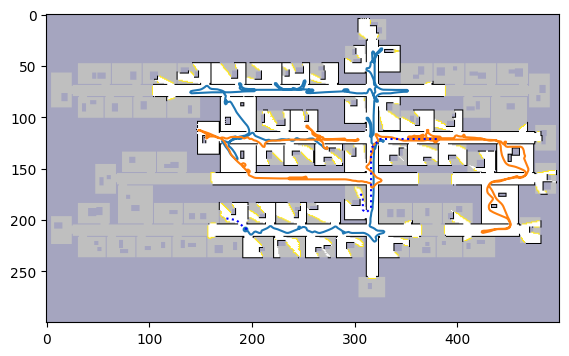

Robot 0 | Subgoal (304, 222) | Dist: 119.80 | Area: 120337 | Cost: -601565.20
Robot 0 | Subgoal (395, 201) | Dist: 516.68 | Area: 398 | Cost: -1473.32
Robot 0 | Subgoal (370, 66) | Dist: 307.11 | Area: 505 | Cost: -2217.89
Robot 0 | Subgoal (108, 65) | Dist: 435.37 | Area: 515 | Cost: -2139.63
Robot 0 | Subgoal (202, 193) | Dist: 45.31 | Area: 121 | Cost: -559.69
Robot 0 | Subgoal (394, 160) | Dist: 446.25 | Area: 363 | Cost: -1368.75
Robot 0 | Subgoal (293, 85) | Dist: 251.63 | Area: 33 | Cost: 86.63
Robot 0 | Subgoal (262, 59) | Dist: 308.28 | Area: 118 | Cost: -281.72
Robot 0 | Subgoal (240, 51) | Dist: 335.53 | Area: 47 | Cost: 100.53
Robot 0 | Subgoal (279, 143) | Dist: 269.97 | Area: 40 | Cost: 69.97
Robot 0 | Subgoal (309, 83) | Dist: 245.49 | Area: 3 | Cost: 230.49
Robot 0 | Subgoal (251, 97) | Dist: 281.94 | Area: 22 | Cost: 171.94
Robot 0 | Subgoal (383, 104) | Dist: 304.77 | Area: 188 | Cost: -635.23
Robot 0 | Subgoal (162, 203) | Dist: 31.66 | Area: 593 | Cost: -2933.34
Rob

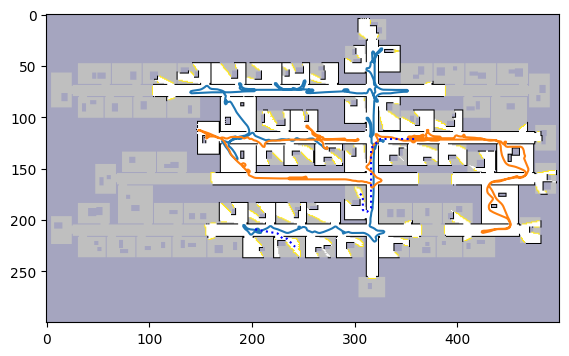

Robot 0 | Subgoal (304, 222) | Dist: 103.56 | Area: 120404 | Cost: -601916.44
Robot 0 | Subgoal (395, 201) | Dist: 502.92 | Area: 398 | Cost: -1487.08
Robot 0 | Subgoal (370, 66) | Dist: 293.36 | Area: 505 | Cost: -2231.64
Robot 0 | Subgoal (108, 65) | Dist: 421.61 | Area: 515 | Cost: -2153.39
Robot 0 | Subgoal (202, 193) | Dist: 31.56 | Area: 121 | Cost: -573.44
Robot 0 | Subgoal (394, 160) | Dist: 432.50 | Area: 363 | Cost: -1382.50
Robot 0 | Subgoal (293, 85) | Dist: 237.87 | Area: 33 | Cost: 72.87
Robot 0 | Subgoal (262, 59) | Dist: 294.53 | Area: 118 | Cost: -295.47
Robot 0 | Subgoal (240, 51) | Dist: 321.77 | Area: 47 | Cost: 86.77
Robot 0 | Subgoal (279, 143) | Dist: 256.21 | Area: 40 | Cost: 56.21
Robot 0 | Subgoal (309, 83) | Dist: 231.73 | Area: 3 | Cost: 216.73
Robot 0 | Subgoal (251, 97) | Dist: 268.18 | Area: 22 | Cost: 158.18
Robot 0 | Subgoal (383, 104) | Dist: 291.01 | Area: 188 | Cost: -648.99
Robot 0 | Subgoal (162, 203) | Dist: 47.90 | Area: 581 | Cost: -2857.10
Robo

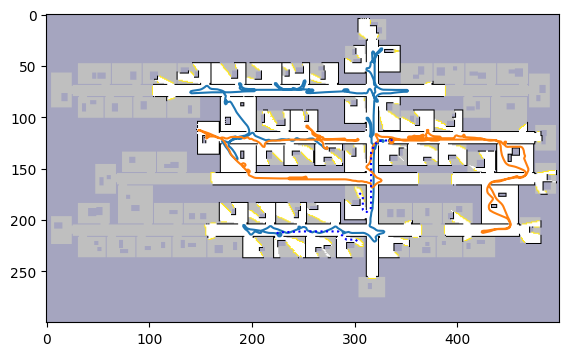

Robot 0 | Subgoal (304, 222) | Dist: 81.73 | Area: 120493 | Cost: -602383.27
Robot 0 | Subgoal (395, 201) | Dist: 482.75 | Area: 398 | Cost: -1507.25
Robot 0 | Subgoal (370, 66) | Dist: 273.18 | Area: 505 | Cost: -2251.82
Robot 0 | Subgoal (108, 65) | Dist: 401.44 | Area: 515 | Cost: -2173.56
Robot 0 | Subgoal (394, 160) | Dist: 412.33 | Area: 363 | Cost: -1402.67
Robot 0 | Subgoal (293, 85) | Dist: 217.70 | Area: 33 | Cost: 52.70
Robot 0 | Subgoal (262, 59) | Dist: 274.36 | Area: 118 | Cost: -315.64
Robot 0 | Subgoal (240, 51) | Dist: 301.60 | Area: 47 | Cost: 66.60
Robot 0 | Subgoal (279, 143) | Dist: 236.04 | Area: 40 | Cost: 36.04
Robot 0 | Subgoal (309, 83) | Dist: 211.56 | Area: 3 | Cost: 196.56
Robot 0 | Subgoal (251, 97) | Dist: 248.01 | Area: 22 | Cost: 138.01
Robot 0 | Subgoal (383, 104) | Dist: 270.84 | Area: 188 | Cost: -669.16
Robot 0 | Subgoal (162, 203) | Dist: 69.73 | Area: 581 | Cost: -2835.27
Robot 0 | Subgoal (315, 7) | Dist: 287.56 | Area: 157 | Cost: -497.44
Robot 

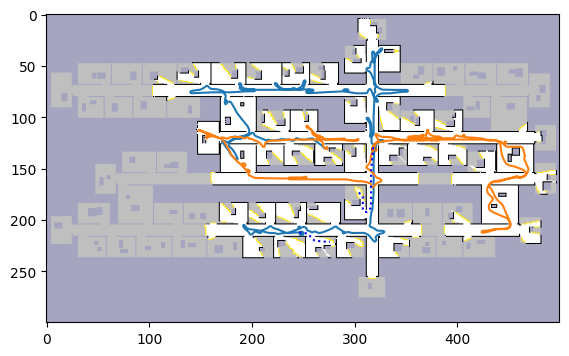

Robot 0 | Subgoal (304, 222) | Dist: 60.73 | Area: 120557 | Cost: -602724.27
Robot 0 | Subgoal (395, 201) | Dist: 461.75 | Area: 398 | Cost: -1528.25
Robot 0 | Subgoal (370, 66) | Dist: 252.18 | Area: 505 | Cost: -2272.82
Robot 0 | Subgoal (108, 65) | Dist: 380.44 | Area: 515 | Cost: -2194.56
Robot 0 | Subgoal (394, 160) | Dist: 391.33 | Area: 363 | Cost: -1423.67
Robot 0 | Subgoal (293, 85) | Dist: 196.70 | Area: 33 | Cost: 31.70
Robot 0 | Subgoal (262, 59) | Dist: 253.36 | Area: 118 | Cost: -336.64
Robot 0 | Subgoal (240, 51) | Dist: 280.60 | Area: 47 | Cost: 45.60
Robot 0 | Subgoal (279, 143) | Dist: 215.04 | Area: 40 | Cost: 15.04
Robot 0 | Subgoal (309, 83) | Dist: 190.56 | Area: 3 | Cost: 175.56
Robot 0 | Subgoal (251, 97) | Dist: 227.01 | Area: 22 | Cost: 117.01
Robot 0 | Subgoal (383, 104) | Dist: 249.84 | Area: 188 | Cost: -690.16
Robot 0 | Subgoal (162, 203) | Dist: 90.73 | Area: 581 | Cost: -2814.27
Robot 0 | Subgoal (315, 7) | Dist: 266.56 | Area: 157 | Cost: -518.44
Robot 

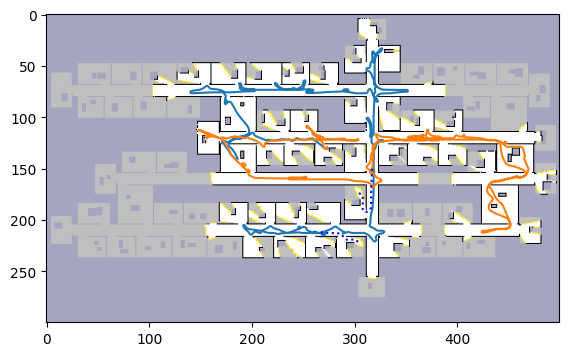

Robot 0 | Subgoal (395, 201) | Dist: 439.75 | Area: 398 | Cost: -1550.25
Robot 0 | Subgoal (370, 66) | Dist: 230.18 | Area: 505 | Cost: -2294.82
Robot 0 | Subgoal (108, 65) | Dist: 358.44 | Area: 515 | Cost: -2216.56
Robot 0 | Subgoal (394, 160) | Dist: 369.33 | Area: 363 | Cost: -1445.67
Robot 0 | Subgoal (246, 185) | Dist: 46.73 | Area: 64 | Cost: -273.27
Robot 0 | Subgoal (293, 85) | Dist: 174.70 | Area: 33 | Cost: 9.70
Robot 0 | Subgoal (262, 59) | Dist: 231.36 | Area: 118 | Cost: -358.64
Robot 0 | Subgoal (240, 51) | Dist: 258.60 | Area: 47 | Cost: 23.60
Robot 0 | Subgoal (279, 143) | Dist: 193.04 | Area: 40 | Cost: -6.96
Robot 0 | Subgoal (309, 83) | Dist: 168.56 | Area: 3 | Cost: 153.56
Robot 0 | Subgoal (251, 97) | Dist: 205.01 | Area: 22 | Cost: 95.01
Robot 0 | Subgoal (383, 104) | Dist: 227.84 | Area: 188 | Cost: -712.16
Robot 0 | Subgoal (162, 203) | Dist: 112.73 | Area: 581 | Cost: -2792.27
Robot 0 | Subgoal (315, 7) | Dist: 244.56 | Area: 157 | Cost: -540.44
Robot 0 | Subg

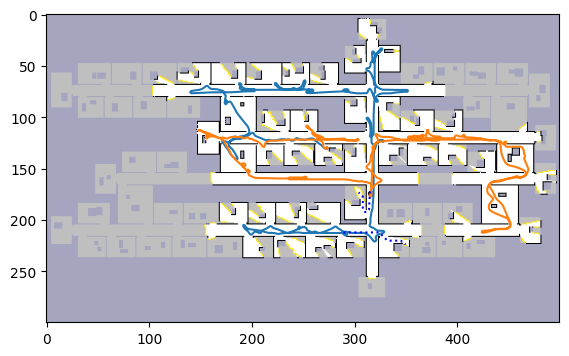

Robot 0 | Subgoal (395, 201) | Dist: 418.75 | Area: 398 | Cost: -1571.25
Robot 0 | Subgoal (370, 66) | Dist: 209.18 | Area: 505 | Cost: -2315.82
Robot 0 | Subgoal (108, 65) | Dist: 337.44 | Area: 515 | Cost: -2237.56
Robot 0 | Subgoal (394, 160) | Dist: 348.33 | Area: 363 | Cost: -1466.67
Robot 0 | Subgoal (246, 185) | Dist: 67.73 | Area: 64 | Cost: -252.27
Robot 0 | Subgoal (293, 85) | Dist: 153.70 | Area: 33 | Cost: -11.30
Robot 0 | Subgoal (262, 59) | Dist: 210.36 | Area: 118 | Cost: -379.64
Robot 0 | Subgoal (240, 51) | Dist: 237.60 | Area: 47 | Cost: 2.60
Robot 0 | Subgoal (279, 143) | Dist: 172.04 | Area: 40 | Cost: -27.96
Robot 0 | Subgoal (309, 83) | Dist: 147.56 | Area: 3 | Cost: 132.56
Robot 0 | Subgoal (251, 97) | Dist: 184.01 | Area: 22 | Cost: 74.01
Robot 0 | Subgoal (383, 104) | Dist: 206.84 | Area: 188 | Cost: -733.16
Robot 0 | Subgoal (162, 203) | Dist: 133.73 | Area: 581 | Cost: -2771.27
Robot 0 | Subgoal (315, 7) | Dist: 223.56 | Area: 157 | Cost: -561.44
Robot 0 | Su

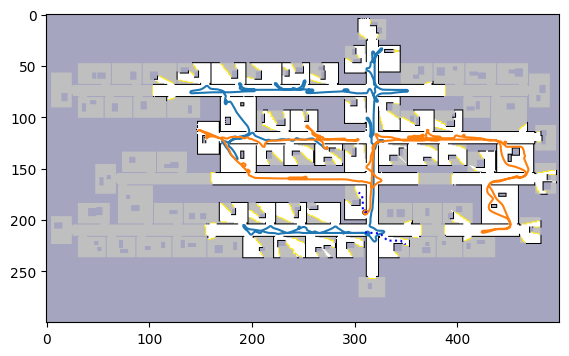

Robot 0 | Subgoal (395, 201) | Dist: 400.85 | Area: 398 | Cost: -1589.15
Robot 0 | Subgoal (370, 66) | Dist: 191.28 | Area: 505 | Cost: -2333.72
Robot 0 | Subgoal (108, 65) | Dist: 319.54 | Area: 515 | Cost: -2255.46
Robot 0 | Subgoal (394, 160) | Dist: 330.43 | Area: 363 | Cost: -1484.57
Robot 0 | Subgoal (246, 185) | Dist: 88.31 | Area: 64 | Cost: -231.69
Robot 0 | Subgoal (293, 85) | Dist: 135.80 | Area: 33 | Cost: -29.20
Robot 0 | Subgoal (262, 59) | Dist: 192.46 | Area: 118 | Cost: -397.54
Robot 0 | Subgoal (240, 51) | Dist: 219.70 | Area: 47 | Cost: -15.30
Robot 0 | Subgoal (279, 143) | Dist: 154.14 | Area: 40 | Cost: -45.86
Robot 0 | Subgoal (309, 83) | Dist: 129.66 | Area: 3 | Cost: 114.66
Robot 0 | Subgoal (251, 97) | Dist: 166.11 | Area: 22 | Cost: 56.11
Robot 0 | Subgoal (383, 104) | Dist: 188.94 | Area: 188 | Cost: -751.06
Robot 0 | Subgoal (162, 203) | Dist: 154.31 | Area: 581 | Cost: -2750.69
Robot 0 | Subgoal (315, 7) | Dist: 205.66 | Area: 157 | Cost: -579.34
Robot 0 | 

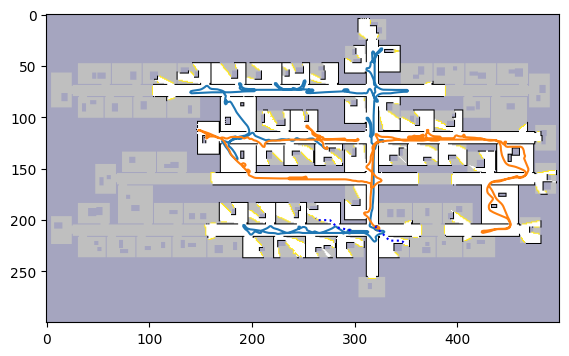

Robot 0 | Subgoal (395, 201) | Dist: 417.51 | Area: 398 | Cost: -1572.49
Robot 0 | Subgoal (370, 66) | Dist: 207.94 | Area: 505 | Cost: -2317.06
Robot 0 | Subgoal (108, 65) | Dist: 336.20 | Area: 515 | Cost: -2238.80
Robot 0 | Subgoal (262, 198) | Dist: 34.14 | Area: 120646 | Cost: -603195.86
Robot 0 | Subgoal (394, 160) | Dist: 347.08 | Area: 363 | Cost: -1467.92
Robot 0 | Subgoal (246, 185) | Dist: 66.49 | Area: 64 | Cost: -253.51
Robot 0 | Subgoal (293, 85) | Dist: 152.46 | Area: 33 | Cost: -12.54
Robot 0 | Subgoal (262, 59) | Dist: 209.11 | Area: 118 | Cost: -380.89
Robot 0 | Subgoal (240, 51) | Dist: 236.36 | Area: 47 | Cost: 1.36
Robot 0 | Subgoal (279, 143) | Dist: 170.80 | Area: 40 | Cost: -29.20
Robot 0 | Subgoal (309, 83) | Dist: 146.31 | Area: 3 | Cost: 131.31
Robot 0 | Subgoal (251, 97) | Dist: 182.77 | Area: 22 | Cost: 72.77
Robot 0 | Subgoal (383, 104) | Dist: 205.60 | Area: 188 | Cost: -734.40
Robot 0 | Subgoal (162, 203) | Dist: 132.49 | Area: 581 | Cost: -2772.51
Robot

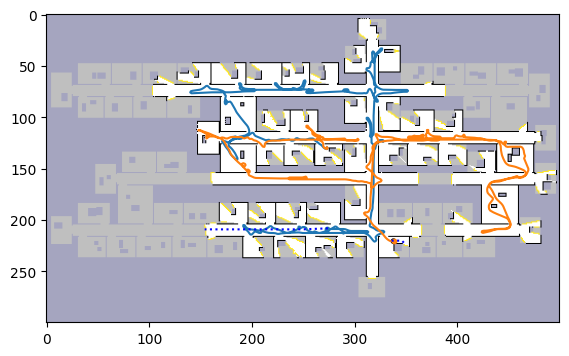

Robot 0 | Subgoal (395, 201) | Dist: 438.10 | Area: 398 | Cost: -1551.90
Robot 0 | Subgoal (370, 66) | Dist: 228.53 | Area: 505 | Cost: -2296.47
Robot 0 | Subgoal (108, 65) | Dist: 356.78 | Area: 515 | Cost: -2218.22
Robot 0 | Subgoal (394, 160) | Dist: 367.67 | Area: 363 | Cost: -1447.33
Robot 0 | Subgoal (246, 185) | Dist: 45.07 | Area: 64 | Cost: -274.93
Robot 0 | Subgoal (293, 85) | Dist: 173.04 | Area: 33 | Cost: 8.04
Robot 0 | Subgoal (262, 59) | Dist: 229.70 | Area: 118 | Cost: -360.30
Robot 0 | Subgoal (240, 51) | Dist: 256.94 | Area: 47 | Cost: 21.94
Robot 0 | Subgoal (279, 143) | Dist: 191.38 | Area: 40 | Cost: -8.62
Robot 0 | Subgoal (309, 83) | Dist: 166.90 | Area: 3 | Cost: 151.90
Robot 0 | Subgoal (251, 97) | Dist: 203.36 | Area: 22 | Cost: 93.36
Robot 0 | Subgoal (383, 104) | Dist: 226.18 | Area: 188 | Cost: -713.82
Robot 0 | Subgoal (162, 203) | Dist: 111.07 | Area: 581 | Cost: -2793.93
Robot 0 | Subgoal (315, 7) | Dist: 242.90 | Area: 157 | Cost: -542.10
Robot 0 | Subg

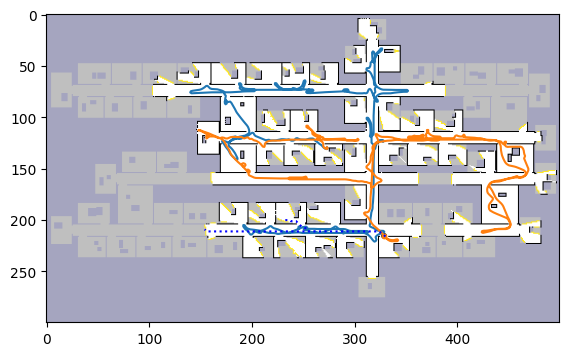

Robot 0 | Subgoal (395, 201) | Dist: 458.68 | Area: 398 | Cost: -1531.32
Robot 0 | Subgoal (370, 66) | Dist: 249.11 | Area: 505 | Cost: -2275.89
Robot 0 | Subgoal (108, 65) | Dist: 377.37 | Area: 515 | Cost: -2197.63
Robot 0 | Subgoal (394, 160) | Dist: 388.25 | Area: 363 | Cost: -1426.75
Robot 0 | Subgoal (246, 185) | Dist: 24.83 | Area: 64 | Cost: -295.17
Robot 0 | Subgoal (293, 85) | Dist: 193.63 | Area: 33 | Cost: 28.63
Robot 0 | Subgoal (262, 59) | Dist: 250.28 | Area: 118 | Cost: -339.72
Robot 0 | Subgoal (229, 200) | Dist: 22.49 | Area: 120722 | Cost: -603587.51
Robot 0 | Subgoal (240, 51) | Dist: 277.53 | Area: 47 | Cost: 42.53
Robot 0 | Subgoal (309, 83) | Dist: 187.49 | Area: 3 | Cost: 172.49
Robot 0 | Subgoal (251, 97) | Dist: 223.94 | Area: 22 | Cost: 113.94
Robot 0 | Subgoal (279, 143) | Dist: 211.97 | Area: 40 | Cost: 11.97
Robot 0 | Subgoal (162, 203) | Dist: 89.66 | Area: 581 | Cost: -2815.34
Robot 0 | Subgoal (315, 7) | Dist: 263.49 | Area: 157 | Cost: -521.51
Robot 0 

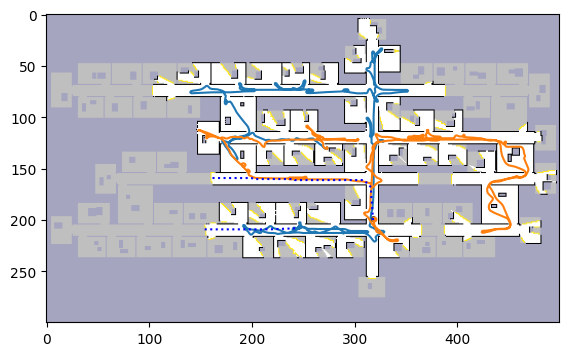

Robot 0 | Subgoal (395, 201) | Dist: 471.10 | Area: 398 | Cost: -1518.90
Robot 0 | Subgoal (370, 66) | Dist: 261.53 | Area: 505 | Cost: -2263.47
Robot 0 | Subgoal (108, 65) | Dist: 389.78 | Area: 515 | Cost: -2185.22
Robot 0 | Subgoal (394, 160) | Dist: 400.67 | Area: 363 | Cost: -1414.33
Robot 0 | Subgoal (246, 185) | Dist: 32.31 | Area: 64 | Cost: -287.69
Robot 0 | Subgoal (293, 85) | Dist: 206.04 | Area: 33 | Cost: 41.04
Robot 0 | Subgoal (262, 59) | Dist: 262.70 | Area: 118 | Cost: -327.30
Robot 0 | Subgoal (240, 51) | Dist: 289.94 | Area: 47 | Cost: 54.94
Robot 0 | Subgoal (279, 143) | Dist: 224.38 | Area: 40 | Cost: 24.38
Robot 0 | Subgoal (309, 83) | Dist: 199.90 | Area: 3 | Cost: 184.90
Robot 0 | Subgoal (251, 97) | Dist: 236.36 | Area: 22 | Cost: 126.36
Robot 0 | Subgoal (383, 104) | Dist: 259.18 | Area: 188 | Cost: -680.82
Robot 0 | Subgoal (162, 203) | Dist: 78.07 | Area: 581 | Cost: -2826.93
Robot 0 | Subgoal (315, 7) | Dist: 275.90 | Area: 157 | Cost: -509.10
Robot 0 | Sub

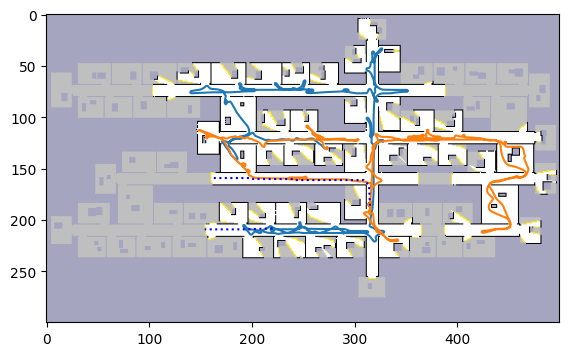

Robot 0 | Subgoal (395, 201) | Dist: 492.10 | Area: 398 | Cost: -1497.90
Robot 0 | Subgoal (370, 66) | Dist: 282.53 | Area: 505 | Cost: -2242.47
Robot 0 | Subgoal (108, 65) | Dist: 410.78 | Area: 515 | Cost: -2164.22
Robot 0 | Subgoal (247, 235) | Dist: 42.94 | Area: 1 | Cost: 37.94
Robot 0 | Subgoal (394, 160) | Dist: 421.67 | Area: 363 | Cost: -1393.33
Robot 0 | Subgoal (246, 185) | Dist: 53.31 | Area: 64 | Cost: -266.69
Robot 0 | Subgoal (293, 85) | Dist: 227.04 | Area: 33 | Cost: 62.04
Robot 0 | Subgoal (262, 59) | Dist: 283.70 | Area: 118 | Cost: -306.30
Robot 0 | Subgoal (240, 51) | Dist: 310.94 | Area: 47 | Cost: 75.94
Robot 0 | Subgoal (279, 143) | Dist: 245.38 | Area: 40 | Cost: 45.38
Robot 0 | Subgoal (309, 83) | Dist: 220.90 | Area: 3 | Cost: 205.90
Robot 0 | Subgoal (251, 97) | Dist: 257.36 | Area: 22 | Cost: 147.36
Robot 0 | Subgoal (383, 104) | Dist: 280.18 | Area: 188 | Cost: -659.82
Robot 0 | Subgoal (162, 203) | Dist: 57.07 | Area: 581 | Cost: -2847.93
Robot 0 | Subgoa

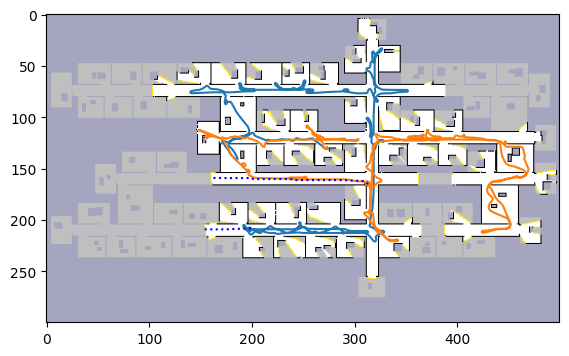

Robot 0 | Subgoal (395, 201) | Dist: 514.10 | Area: 398 | Cost: -1475.90
Robot 0 | Subgoal (370, 66) | Dist: 304.53 | Area: 505 | Cost: -2220.47
Robot 0 | Subgoal (108, 65) | Dist: 432.78 | Area: 515 | Cost: -2142.22
Robot 0 | Subgoal (247, 235) | Dist: 64.94 | Area: 1 | Cost: 59.94
Robot 0 | Subgoal (394, 160) | Dist: 443.67 | Area: 363 | Cost: -1371.33
Robot 0 | Subgoal (246, 185) | Dist: 75.31 | Area: 64 | Cost: -244.69
Robot 0 | Subgoal (293, 85) | Dist: 249.04 | Area: 33 | Cost: 84.04
Robot 0 | Subgoal (262, 59) | Dist: 305.70 | Area: 118 | Cost: -284.30
Robot 0 | Subgoal (240, 51) | Dist: 332.94 | Area: 47 | Cost: 97.94
Robot 0 | Subgoal (279, 143) | Dist: 267.38 | Area: 40 | Cost: 67.38
Robot 0 | Subgoal (309, 83) | Dist: 242.90 | Area: 3 | Cost: 227.90
Robot 0 | Subgoal (251, 97) | Dist: 279.36 | Area: 22 | Cost: 169.36
Robot 0 | Subgoal (383, 104) | Dist: 302.18 | Area: 188 | Cost: -637.82
Robot 0 | Subgoal (162, 203) | Dist: 35.07 | Area: 581 | Cost: -2869.93
Robot 0 | Subgoa

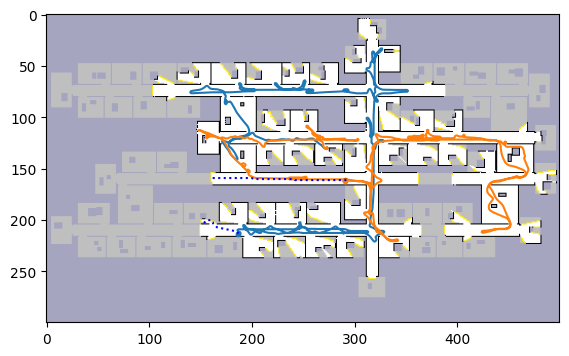

Robot 0 | Subgoal (395, 201) | Dist: 526.75 | Area: 398 | Cost: -1463.25
Robot 0 | Subgoal (370, 66) | Dist: 317.18 | Area: 505 | Cost: -2207.82
Robot 0 | Subgoal (108, 65) | Dist: 445.44 | Area: 515 | Cost: -2129.56
Robot 0 | Subgoal (247, 235) | Dist: 74.28 | Area: 1 | Cost: 69.28
Robot 0 | Subgoal (150, 201) | Dist: 38.14 | Area: 544 | Cost: -2681.86
Robot 0 | Subgoal (394, 160) | Dist: 456.33 | Area: 363 | Cost: -1358.67
Robot 0 | Subgoal (246, 185) | Dist: 87.97 | Area: 64 | Cost: -232.03
Robot 0 | Subgoal (175, 188) | Dist: 32.38 | Area: 65 | Cost: -292.62
Robot 0 | Subgoal (293, 85) | Dist: 261.70 | Area: 33 | Cost: 96.70
Robot 0 | Subgoal (262, 59) | Dist: 318.36 | Area: 118 | Cost: -271.64
Robot 0 | Subgoal (240, 51) | Dist: 345.60 | Area: 47 | Cost: 110.60
Robot 0 | Subgoal (279, 143) | Dist: 280.04 | Area: 40 | Cost: 80.04
Robot 0 | Subgoal (309, 83) | Dist: 255.56 | Area: 3 | Cost: 240.56
Robot 0 | Subgoal (251, 97) | Dist: 292.01 | Area: 22 | Cost: 182.01
Robot 0 | Subgoal

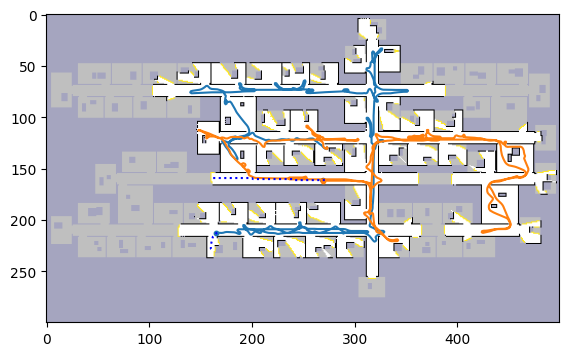

Robot 0 | Subgoal (395, 201) | Dist: 548.17 | Area: 398 | Cost: -1441.83
Robot 0 | Subgoal (370, 66) | Dist: 338.60 | Area: 505 | Cost: -2186.40
Robot 0 | Subgoal (108, 65) | Dist: 466.85 | Area: 515 | Cost: -2108.15
Robot 0 | Subgoal (247, 235) | Dist: 94.87 | Area: 1 | Cost: 89.87
Robot 0 | Subgoal (150, 201) | Dist: 21.66 | Area: 269 | Cost: -1323.34
Robot 0 | Subgoal (394, 160) | Dist: 477.74 | Area: 363 | Cost: -1337.26
Robot 0 | Subgoal (246, 185) | Dist: 109.38 | Area: 64 | Cost: -210.62
Robot 0 | Subgoal (175, 188) | Dist: 52.04 | Area: 65 | Cost: -272.96
Robot 0 | Subgoal (293, 85) | Dist: 283.11 | Area: 33 | Cost: 118.11
Robot 0 | Subgoal (262, 59) | Dist: 339.77 | Area: 118 | Cost: -250.23
Robot 0 | Subgoal (240, 51) | Dist: 367.01 | Area: 47 | Cost: 132.01
Robot 0 | Subgoal (279, 143) | Dist: 301.46 | Area: 40 | Cost: 101.46
Robot 0 | Subgoal (309, 83) | Dist: 276.97 | Area: 3 | Cost: 261.97
Robot 0 | Subgoal (251, 97) | Dist: 313.43 | Area: 22 | Cost: 203.43
Robot 0 | Subg

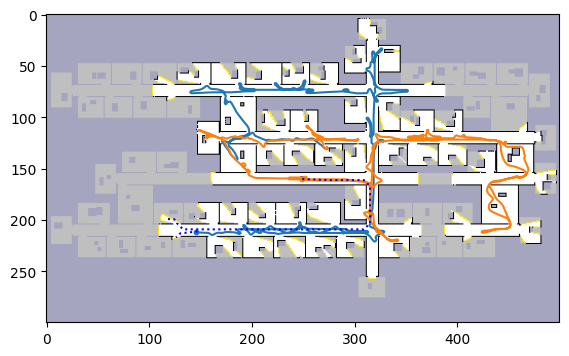

Robot 0 | Subgoal (395, 201) | Dist: 566.34 | Area: 398 | Cost: -1423.66
Robot 0 | Subgoal (370, 66) | Dist: 356.77 | Area: 505 | Cost: -2168.23
Robot 0 | Subgoal (108, 65) | Dist: 485.02 | Area: 515 | Cost: -2089.98
Robot 0 | Subgoal (247, 235) | Dist: 114.70 | Area: 1 | Cost: 109.70
Robot 0 | Subgoal (150, 201) | Dist: 30.90 | Area: 269 | Cost: -1314.10
Robot 0 | Subgoal (394, 160) | Dist: 495.91 | Area: 363 | Cost: -1319.09
Robot 0 | Subgoal (246, 185) | Dist: 127.56 | Area: 64 | Cost: -192.44
Robot 0 | Subgoal (175, 188) | Dist: 70.21 | Area: 65 | Cost: -254.79
Robot 0 | Subgoal (293, 85) | Dist: 301.28 | Area: 33 | Cost: 136.28
Robot 0 | Subgoal (262, 59) | Dist: 357.94 | Area: 118 | Cost: -232.06
Robot 0 | Subgoal (240, 51) | Dist: 385.18 | Area: 47 | Cost: 150.18
Robot 0 | Subgoal (279, 143) | Dist: 319.63 | Area: 40 | Cost: 119.63
Robot 0 | Subgoal (309, 83) | Dist: 295.14 | Area: 3 | Cost: 280.14
Robot 0 | Subgoal (251, 97) | Dist: 331.60 | Area: 22 | Cost: 221.60
Robot 0 | Su

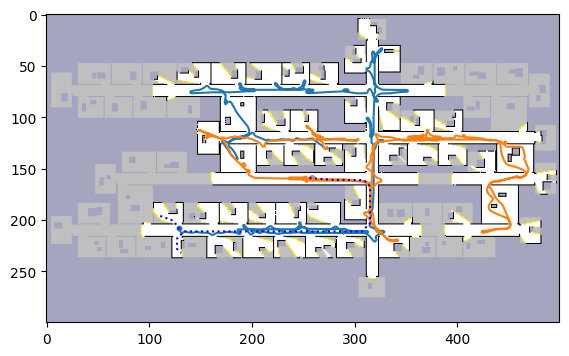

Robot 0 | Subgoal (395, 201) | Dist: 580.27 | Area: 398 | Cost: -1409.73
Robot 0 | Subgoal (370, 66) | Dist: 370.70 | Area: 505 | Cost: -2154.30
Robot 0 | Subgoal (108, 65) | Dist: 498.95 | Area: 515 | Cost: -2076.05
Robot 0 | Subgoal (247, 235) | Dist: 132.77 | Area: 1 | Cost: 127.77
Robot 0 | Subgoal (150, 201) | Dist: 44.83 | Area: 250 | Cost: -1205.17
Robot 0 | Subgoal (394, 160) | Dist: 509.84 | Area: 363 | Cost: -1305.16
Robot 0 | Subgoal (246, 185) | Dist: 141.49 | Area: 64 | Cost: -178.51
Robot 0 | Subgoal (175, 188) | Dist: 84.14 | Area: 65 | Cost: -240.86
Robot 0 | Subgoal (293, 85) | Dist: 315.21 | Area: 33 | Cost: 150.21
Robot 0 | Subgoal (262, 59) | Dist: 371.87 | Area: 118 | Cost: -218.13
Robot 0 | Subgoal (240, 51) | Dist: 399.11 | Area: 47 | Cost: 164.11
Robot 0 | Subgoal (279, 143) | Dist: 333.56 | Area: 40 | Cost: 133.56
Robot 0 | Subgoal (309, 83) | Dist: 309.07 | Area: 3 | Cost: 294.07
Robot 0 | Subgoal (251, 97) | Dist: 345.53 | Area: 22 | Cost: 235.53
Robot 0 | Su

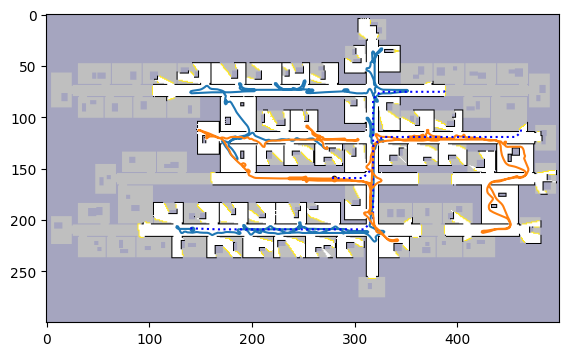

Robot 0 | Subgoal (395, 201) | Dist: 566.10 | Area: 398 | Cost: -1423.90
Robot 0 | Subgoal (370, 66) | Dist: 356.53 | Area: 505 | Cost: -2168.47
Robot 0 | Subgoal (108, 65) | Dist: 484.78 | Area: 515 | Cost: -2090.22
Robot 0 | Subgoal (247, 235) | Dist: 116.94 | Area: 1 | Cost: 111.94
Robot 0 | Subgoal (150, 201) | Dist: 30.66 | Area: 250 | Cost: -1219.34
Robot 0 | Subgoal (394, 160) | Dist: 495.67 | Area: 363 | Cost: -1319.33
Robot 0 | Subgoal (246, 185) | Dist: 127.31 | Area: 64 | Cost: -192.69
Robot 0 | Subgoal (175, 188) | Dist: 69.97 | Area: 65 | Cost: -255.03
Robot 0 | Subgoal (293, 85) | Dist: 301.04 | Area: 33 | Cost: 136.04
Robot 0 | Subgoal (262, 59) | Dist: 357.70 | Area: 118 | Cost: -232.30
Robot 0 | Subgoal (117, 188) | Dist: 38.38 | Area: 73 | Cost: -326.62
Robot 0 | Subgoal (240, 51) | Dist: 384.94 | Area: 47 | Cost: 149.94
Robot 0 | Subgoal (279, 143) | Dist: 319.38 | Area: 40 | Cost: 119.38
Robot 0 | Subgoal (309, 83) | Dist: 294.90 | Area: 3 | Cost: 279.90
Robot 0 | S

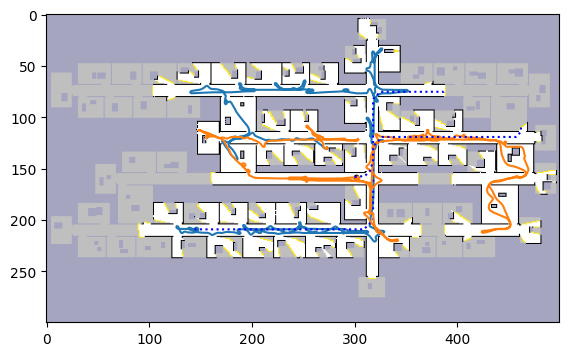

Robot 0 | Subgoal (395, 201) | Dist: 562.51 | Area: 398 | Cost: -1427.49
Robot 0 | Subgoal (370, 66) | Dist: 352.94 | Area: 505 | Cost: -2172.06
Robot 0 | Subgoal (108, 65) | Dist: 481.20 | Area: 515 | Cost: -2093.80
Robot 0 | Subgoal (247, 235) | Dist: 112.53 | Area: 1 | Cost: 107.53
Robot 0 | Subgoal (150, 201) | Dist: 27.07 | Area: 250 | Cost: -1222.93
Robot 0 | Subgoal (394, 160) | Dist: 492.08 | Area: 363 | Cost: -1322.92
Robot 0 | Subgoal (246, 185) | Dist: 123.73 | Area: 64 | Cost: -196.27
Robot 0 | Subgoal (175, 188) | Dist: 66.38 | Area: 65 | Cost: -258.62
Robot 0 | Subgoal (293, 85) | Dist: 297.46 | Area: 33 | Cost: 132.46
Robot 0 | Subgoal (262, 59) | Dist: 354.11 | Area: 118 | Cost: -235.89
Robot 0 | Subgoal (117, 188) | Dist: 42.80 | Area: 73 | Cost: -322.20
Robot 0 | Subgoal (240, 51) | Dist: 381.36 | Area: 47 | Cost: 146.36
Robot 0 | Subgoal (279, 143) | Dist: 315.80 | Area: 40 | Cost: 115.80
Robot 0 | Subgoal (309, 83) | Dist: 291.31 | Area: 3 | Cost: 276.31
Robot 0 | S

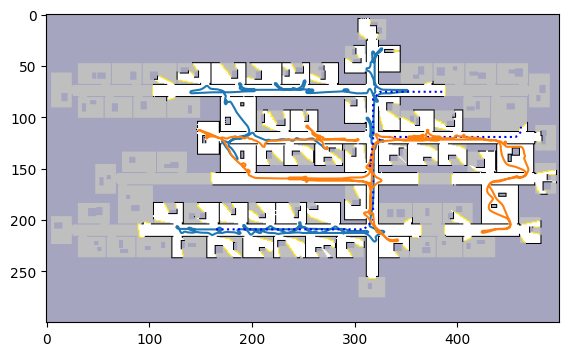

Robot 0 | Subgoal (395, 201) | Dist: 540.51 | Area: 398 | Cost: -1449.49
Robot 0 | Subgoal (370, 66) | Dist: 330.94 | Area: 505 | Cost: -2194.06
Robot 0 | Subgoal (108, 65) | Dist: 459.20 | Area: 515 | Cost: -2115.80
Robot 0 | Subgoal (247, 235) | Dist: 90.53 | Area: 1 | Cost: 85.53
Robot 0 | Subgoal (150, 201) | Dist: 21.90 | Area: 247 | Cost: -1213.10
Robot 0 | Subgoal (394, 160) | Dist: 470.08 | Area: 363 | Cost: -1344.92
Robot 0 | Subgoal (246, 185) | Dist: 101.73 | Area: 64 | Cost: -218.27
Robot 0 | Subgoal (175, 188) | Dist: 44.38 | Area: 65 | Cost: -280.62
Robot 0 | Subgoal (293, 85) | Dist: 275.46 | Area: 33 | Cost: 110.46
Robot 0 | Subgoal (262, 59) | Dist: 332.11 | Area: 118 | Cost: -257.89
Robot 0 | Subgoal (117, 188) | Dist: 64.80 | Area: 73 | Cost: -300.20
Robot 0 | Subgoal (240, 51) | Dist: 359.36 | Area: 47 | Cost: 124.36
Robot 0 | Subgoal (279, 143) | Dist: 293.80 | Area: 40 | Cost: 93.80
Robot 0 | Subgoal (309, 83) | Dist: 269.31 | Area: 3 | Cost: 254.31
Robot 0 | Subg

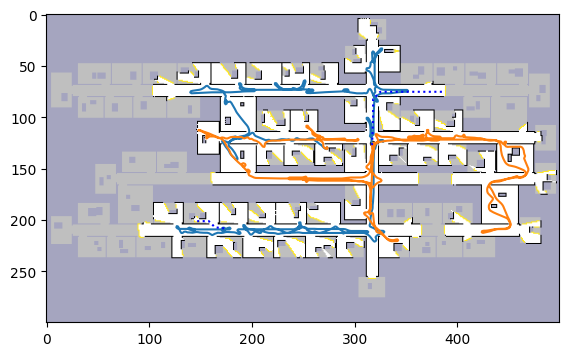

Robot 0 | Subgoal (395, 201) | Dist: 540.10 | Area: 398 | Cost: -1449.90
Robot 0 | Subgoal (370, 66) | Dist: 330.53 | Area: 505 | Cost: -2194.47
Robot 0 | Subgoal (108, 65) | Dist: 458.78 | Area: 515 | Cost: -2116.22
Robot 0 | Subgoal (247, 235) | Dist: 90.94 | Area: 1 | Cost: 85.94
Robot 0 | Subgoal (394, 160) | Dist: 469.67 | Area: 363 | Cost: -1345.33
Robot 0 | Subgoal (246, 185) | Dist: 101.31 | Area: 64 | Cost: -218.69
Robot 0 | Subgoal (175, 188) | Dist: 43.97 | Area: 65 | Cost: -281.03
Robot 0 | Subgoal (293, 85) | Dist: 275.04 | Area: 33 | Cost: 110.04
Robot 0 | Subgoal (262, 59) | Dist: 331.70 | Area: 118 | Cost: -258.30
Robot 0 | Subgoal (117, 188) | Dist: 64.38 | Area: 73 | Cost: -300.62
Robot 0 | Subgoal (240, 51) | Dist: 358.94 | Area: 47 | Cost: 123.94
Robot 0 | Subgoal (279, 143) | Dist: 293.38 | Area: 40 | Cost: 93.38
Robot 0 | Subgoal (309, 83) | Dist: 268.90 | Area: 3 | Cost: 253.90
Robot 0 | Subgoal (251, 97) | Dist: 305.36 | Area: 22 | Cost: 195.36
Robot 0 | Subgoal

In [ ]:
# Instantiate the simulated environment
# world = environments.simulated.OccupancyGridWorld(
#         known_map,
#         map_data,
#         num_breadcrumb_elements=args.num_breadcrumb_elements,
#         min_breadcrumb_signed_distance=4.0 * args.base_resolution)

# builder = environments.simulated.WorldBuildingUnityBridge
# with builder(args.unity_path) as unity_bridge:
#     unity_bridge.make_world(world)

colors = plt.get_cmap('tab10').colors

if True:
    simulator = lsp.simulators.Simulator(known_map,
                                         args,
                                         unity_bridge=None,
                                         world=None,
                                         verbose=False)
    # set the inflation radius
    simulator.frontier_grouping_inflation_radius = simulator.inflation_radius

    planning_loop = mr_exploration.planners.MRPlanningLoop(known_map,
                                                  simulator,
                                                  unity_bridge=None,
                                                  robots=robot_team,
                                                  args=args,
                                                  verbose=False)
    for counter, step_data in enumerate(planning_loop):
        planner.update({'images': step_data['images']},
                        step_data['robot_grids'],
                        step_data['subgoals'],
                        step_data['robot_poses'],
                        step_data['visibility_masks'],)
        joint_action = planner.compute_selected_subgoal(known_map)
        #print(joint_action)
        planning_loop.set_chosen_subgoals(joint_action, counter)

        # Print and plot in every 12 steps
        if counter % 12 == 0:
            # printing
            print('----------------------------------------')
            print(f'Counter: {counter}')
            #print(f'Goal: {goal.x}, {goal.y}')
            for i, robot in enumerate(robot_team):
                print(f'Robot{i}: ({robot.pose.x:.2f}, {robot.pose.y:.2f})')
                print(f'Total motion: {robot_team[0].net_motion:.2f}')
    
                # plotting
                plt.ion()
                plt.figure(1, figsize=(12, 4))
                plt.clf()
                # mrlsp.utils.plotting.visualize_robots(args=args,
                #                                       robots=robot_team,
                #                                       observed_map=planner.observed_map,
                #                                       pano_images=None,
                #                                       subgoals=planner.subgoals,
                #                                       goal_pose=goal,
                #                                       paths=planning_loop.paths,
                #                                       known_map=known_map,
                #                                       timestamp=counter)
                # plt.show()
                #goal_pose=goal
                robots=robot_team
                subgoals=planner.subgoals
                observed_map=planner.observed_map
                paths=planning_loop.paths
                ax = plt.gca()
                mr_exploration.utils.plotting.plot_grid_with_frontiers(ax, observed_map, known_map, subgoals)
                mr_exploration.utils.plotting.plot_pose(ax, robots[i].pose, filled=False) #made sure had 2 positional arguments
            #print(f'Available frontiers: {subgoals}')
            #print(f'Robots chosen subgoals: {planning_loop.chosen_subgoals}')
            
            for i in range(args.num_robots):
                mr_exploration.utils.plotting.plot_pose(ax, robots[i].pose, color=colors[i])
                mr_exploration.utils.plotting.plot_pose_path(ax, robots[i].all_poses, color=colors[i])
                if paths[i] is not None:
                    mr_exploration.utils.plotting.plot_path(ax, paths[i])

            plt.show()